In [18]:
"""
Small VRP optimization using Large Neighborhood Search (LNS).
This approach allows for truly global optimization by destroying and rebuilding parts
of the solution, enabling clients to move between different vehicle routes.
"""

import os
import sys
import copy
import time
import random
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib.patches import Patch  # Add this import for the legend

# Set problem configuration
PROBLEM_SIZE = "small"
CAPACITIES = [100, 100, 100]  # Same capacity for all vehicles
VEHICLE_COUNTS = [2, 3, 4]    # We'll solve for these configurations

# LNS parameters - adjusted for smaller problem
MAX_ITERATIONS = 200
MAX_NO_IMPROVEMENT = 50
DESTROY_PERCENTAGE = 0.3  # Percentage of clients to remove in each iteration

In [19]:
def read_vrp_data(problem_size="small", vehicle_count=None):
    """Read VRP data and optionally vehicle data from files."""
    import csv
    import os

    # Get current working directory to find data path
    script_path = os.getcwd()
    data_path = os.path.join(script_path, "data")
    
    print(f"Reading data for {problem_size}-vrp...")
    
    # Construct paths to the clients and vehicles data files
    vrp_data_path = os.path.join(data_path, f"{problem_size}-vrp", "vrp.csv")
    vehicles_data_path = None
    if vehicle_count is not None:
        vehicles_data_path = os.path.join(data_path, f"{problem_size}-vrp", f"{vehicle_count}.vehicles.csv")
    
    print(f"Looking for client data at: {vrp_data_path}")
    
    # Read client and depot data
    clients = []
    depot = None
    
    with open(vrp_data_path, mode="r") as file:
        reader = csv.DictReader(file, delimiter=";")
        for row in reader:
            node = {
                "ID": int(row["ID"]),
                "X": float(row["X"]),
                "Y": float(row["Y"]),
                "Demand": int(row["Demand"])
            }
            
            if node["ID"] == 0:  # Depot has ID 0
                depot = node
            else:
                clients.append(node)
    
    print(f"Read {len(clients)} clients and 1 depot.")
    
    # Check if the specific vehicles.csv exists
    vehicles = []
    if vehicles_data_path and os.path.exists(vehicles_data_path):
        print(f"Looking for vehicle data at: {vehicles_data_path}")
        with open(vehicles_data_path, mode="r") as file:
            reader = csv.DictReader(file, delimiter=";")
            for row in reader:
                vehicle = {
                    "Vehicle_ID": int(row["Vehicle_ID"]),
                    "Capacity": int(row["Capacity"])
                }
                vehicles.append(vehicle)
        print(f"Read {len(vehicles)} vehicles from file.")
    else:
        print(f"No vehicles file found for {vehicle_count} vehicles. Vehicles will need to be generated dynamically.")
    
    return depot, clients, vehicles

def calculate_distance(point1, point2):
    """Calculate Euclidean distance between two points."""
    return ((point1["X"] - point2["X"])**2 + (point1["Y"] - point2["Y"])**2)**0.5

def calculate_route_distance(route, client_map):
    """Calculate the total distance of a route."""
    distance = 0
    for i in range(len(route) - 1):
        from_node = client_map[route[i]]
        to_node = client_map[route[i + 1]]
        distance += calculate_distance(from_node, to_node)
    return distance

def calculate_total_distance(routes, client_map):
    """Calculate the total distance of all routes."""
    return sum(calculate_route_distance(route, client_map) for route in routes.values())

In [20]:
def apply_2opt(route, client_map, max_iterations=100):
    """Apply 2-opt optimization to a single route."""
    if len(route) <= 3:  # Route with 0 or 1 client can't be improved
        return route, calculate_route_distance(route, client_map)
    
    improved = True
    best_route = route.copy()
    best_distance = calculate_route_distance(route, client_map)
    
    iteration = 0
    while improved and iteration < max_iterations:
        improved = False
        iteration += 1
        
        for i in range(1, len(best_route) - 2):  # Skip depot at start
            for j in range(i + 1, len(best_route) - 1):  # Skip depot at end
                # Skip if segments are adjacent
                if j == i + 1:
                    continue
                    
                # Create new route with 2-opt swap
                # This reverses the segment between i and j
                new_route = best_route[:i] + best_route[i:j+1][::-1] + best_route[j+1:]
                
                # Calculate new distance
                new_distance = calculate_route_distance(new_route, client_map)
                
                # If better, keep it
                if new_distance < best_distance:
                    best_route = new_route
                    best_distance = new_distance
                    improved = True
                    break
            if improved:
                break
                
    return best_route, best_distance

In [21]:
def create_initial_solution(depot, clients, vehicles, client_map):
    """
    Create an initial solution using a simple assignment strategy.
    For small problems, we initialize with a balanced distribution.
    """
    # Initialize routes
    routes = {}
    for i, vehicle in enumerate(vehicles):
        vehicle_id = vehicle["Vehicle_ID"]
        routes[vehicle_id] = [0]  # Start at depot
    
    # Distribute clients evenly among vehicles initially
    for i, client in enumerate(clients):
        client_id = client["ID"]
        vehicle_id = vehicles[i % len(vehicles)]["Vehicle_ID"]
        routes[vehicle_id].append(client_id)
    
    # Add return to depot for all routes
    for vehicle_id in routes:
        routes[vehicle_id].append(0)
    
    # Apply 2-opt to each route
    for vehicle_id, route in routes.items():
        routes[vehicle_id], _ = apply_2opt(route, client_map)
    
    return routes

def destroy_solution(routes, percentage, client_map):
    """
    Destroy part of the solution by removing some clients.
    Returns the modified routes and a list of removed clients.
    """
    # Flatten all client IDs (excluding depots)
    all_clients = []
    for route in routes.values():
        all_clients.extend([node for node in route if node != 0])
    
    # Calculate how many clients to remove
    remove_count = max(1, int(len(all_clients) * percentage))
    
    # Randomly select clients to remove
    clients_to_remove = random.sample(all_clients, remove_count)
    
    # Remove selected clients from routes
    new_routes = copy.deepcopy(routes)
    for vehicle_id, route in new_routes.items():
        new_route = [0]  # Start with depot
        for node in route:
            if node != 0 and node in clients_to_remove:
                continue  # Skip removed clients
            elif node != 0:
                new_route.append(node)
        
        if len(new_route) > 1:  # If route has at least one client
            new_route.append(0)  # End with depot
            new_routes[vehicle_id] = new_route
        else:
            new_routes[vehicle_id] = [0, 0]  # Empty route (just depot to depot)
    
    return new_routes, clients_to_remove

def repair_solution(routes, removed_clients, client_map, vehicles, depot, clients):
    """
    Repair the solution by inserting removed clients back into routes.
    Uses a greedy insertion heuristic.
    """
    # Create a map of clients for easy access
    clients_data = {client["ID"]: client for client in clients}
    
    # Track vehicle loads
    vehicle_loads = {}
    for vehicle_id, route in routes.items():
        vehicle_loads[vehicle_id] = sum(clients_data[node]["Demand"] 
                                      for node in route if node != 0)
    
    # Get vehicle capacities
    vehicle_capacities = {v["Vehicle_ID"]: v["Capacity"] for v in vehicles}
    
    # Sort removed clients by demand (descending) to insert larger demands first
    removed_clients.sort(key=lambda x: clients_data[x]["Demand"], reverse=True)
    
    # For tracking unassigned clients
    unassigned_clients = []
    
    # Insert each removed client at the best position
    for client_id in removed_clients:
        client_demand = clients_data[client_id]["Demand"]
        
        best_insertion = None
        best_insertion_cost = float('inf')
        
        # Try insertion in each route
        for vehicle_id, route in routes.items():
            # Skip if vehicle capacity would be exceeded
            if vehicle_loads[vehicle_id] + client_demand > vehicle_capacities[vehicle_id]:
                continue
                
            # Try each insertion position
            for i in range(1, len(route)):  # Skip inserting at position 0 (depot)
                # Create new route with client inserted
                new_route = route[:i] + [client_id] + route[i:]
                
                # Calculate insertion cost (increase in route distance)
                original_dist = calculate_route_distance(route, client_map)
                new_dist = calculate_route_distance(new_route, client_map)
                insertion_cost = new_dist - original_dist
                
                if insertion_cost < best_insertion_cost:
                    best_insertion = (vehicle_id, i)
                    best_insertion_cost = insertion_cost
        
        # Insert client at best position
        if best_insertion:
            vehicle_id, position = best_insertion
            routes[vehicle_id].insert(position, client_id)
            vehicle_loads[vehicle_id] += client_demand
        else:
            # If no insertion possible, try to find an empty vehicle
            empty_vehicle_found = False
            for vehicle in vehicles:
                vehicle_id = vehicle["Vehicle_ID"]
                if vehicle_id not in routes or routes[vehicle_id] == [0, 0]:
                    routes[vehicle_id] = [0, client_id, 0]
                    vehicle_loads[vehicle_id] = client_demand
                    empty_vehicle_found = True
                    break
            
            # If no empty vehicle, insert in vehicle with least load percentage
            if not empty_vehicle_found:
                print(f"WARNING: Client {client_id} (demand={client_demand}) could not be inserted normally")
                # Find vehicle with most remaining capacity (as a percentage)
                best_vehicle = None
                best_remaining_pct = -1
                
                for vehicle_id, current_load in vehicle_loads.items():
                    capacity = vehicle_capacities[vehicle_id]
                    remaining_pct = (capacity - current_load) / capacity
                    if remaining_pct > best_remaining_pct:
                        best_remaining_pct = remaining_pct
                        best_vehicle = vehicle_id
                
                # Force insert into best vehicle, even if it exceeds capacity
                if best_vehicle is not None:
                    # Insert at position that minimizes additional distance
                    route = routes[best_vehicle]
                    best_pos = 1  # Default after depot
                    best_insert_cost = float('inf')
                    
                    for pos in range(1, len(route)):
                        new_route = route[:pos] + [client_id] + route[pos:]
                        new_dist = calculate_route_distance(new_route, client_map)
                        orig_dist = calculate_route_distance(route, client_map)
                        insert_cost = new_dist - orig_dist
                        
                        if insert_cost < best_insert_cost:
                            best_insert_cost = insert_cost
                            best_pos = pos
                    
                    routes[best_vehicle].insert(best_pos, client_id)
                    vehicle_loads[best_vehicle] += client_demand
                    print(f"  → Forced insertion into Vehicle {best_vehicle} at position {best_pos}")
                    print(f"  → New load: {vehicle_loads[best_vehicle]}/{vehicle_capacities[best_vehicle]} " +
                          f"({vehicle_loads[best_vehicle]/vehicle_capacities[best_vehicle]*100:.1f}%)")
                else:
                    # This should never happen if there's at least one vehicle
                    unassigned_clients.append(client_id)
                    print(f"ERROR: Could not assign client {client_id} to any vehicle!")
    
    # Verify all clients are assigned
    if unassigned_clients:
        print(f"ERROR: {len(unassigned_clients)} clients could not be assigned: {unassigned_clients}")
    
    # Apply 2-opt to each route
    for vehicle_id, route in routes.items():
        if len(route) > 3:  # Only apply to routes with at least 2 clients
            routes[vehicle_id], _ = apply_2opt(route, client_map)
    
    return routes

In [22]:
def large_neighborhood_search(depot, clients, vehicles):
    """
    Implement Large Neighborhood Search for VRP optimization.
    
    Returns both initial solution and optimized solution for comparison.
    """
    print(f"Starting LNS with {len(vehicles)} vehicles of capacity {vehicles[0]['Capacity']}...")
    start_time = time.time()
    
    # Create client map for easier access
    client_map = {client["ID"]: client for client in clients}
    client_map[0] = depot  # Add depot
    
    # Create initial solution
    initial_solution = create_initial_solution(depot, clients, vehicles, client_map)
    initial_distance = calculate_total_distance(initial_solution, client_map)
    
    # Save the initial solution for comparison
    current_solution = copy.deepcopy(initial_solution)
    current_distance = initial_distance
    
    # Save best solution
    best_solution = copy.deepcopy(current_solution)
    best_distance = current_distance
    
    print(f"Initial solution distance: {initial_distance:.2f}")
    
    # LNS iterations
    iteration = 0
    iterations_no_improvement = 0
    
    while iteration < MAX_ITERATIONS and iterations_no_improvement < MAX_NO_IMPROVEMENT:
        iteration += 1
        
        # Destroy part of the solution
        destroyed_solution, removed_clients = destroy_solution(
            current_solution, DESTROY_PERCENTAGE, client_map
        )
        
        # Repair the solution
        repaired_solution = repair_solution(
            destroyed_solution, removed_clients, client_map, vehicles, depot, clients
        )
        
        # Calculate the new distance
        new_distance = calculate_total_distance(repaired_solution, client_map)
        
        # Accept the new solution if it's better
        if new_distance < current_distance:
            current_solution = copy.deepcopy(repaired_solution)
            current_distance = new_distance
            iterations_no_improvement = 0
            
            # Update best solution if improved
            if new_distance < best_distance:
                best_solution = copy.deepcopy(repaired_solution)
                best_distance = new_distance
                print(f"Iteration {iteration}: New best distance: {best_distance:.2f}")
        else:
            iterations_no_improvement += 1
        
        # Simple progress report
        if iteration % 50 == 0:
            print(f"Iteration {iteration}: Current distance: {current_distance:.2f}, " +
                  f"Best: {best_distance:.2f}, No improvement: {iterations_no_improvement}")
    
    # Calculate how many vehicles are actually used
    used_vehicles = sum(1 for route in best_solution.values() if len(route) > 2)
    
    end_time = time.time()
    print(f"LNS completed in {end_time - start_time:.2f} seconds")
    print(f"Initial distance: {initial_distance:.2f}")
    print(f"Final best distance: {best_distance:.2f}")
    print(f"Improvement: {(initial_distance - best_distance) / initial_distance * 100:.2f}%")
    print(f"Vehicles used: {used_vehicles} out of {len(vehicles)}")
    
    # ADD THIS VALIDATION CODE HERE
    # Validate that all clients are in the best solution
    client_ids = set(client["ID"] for client in clients)
    clients_in_solution = set()
    for route in best_solution.values():
        for node_id in route:
            if node_id != 0:  # Skip depot
                clients_in_solution.add(node_id)

    missing_clients = client_ids - clients_in_solution
    if missing_clients:
        print(f"WARNING: {len(missing_clients)} clients are missing from the solution: {missing_clients}")
        # For debugging: show which vehicles have capacity left
        vehicle_loads = {}
        for vehicle_id, route in best_solution.items():
            route_demand = sum(client_map[node_id]["Demand"] for node_id in route if node_id != 0)
            capacity = next(v["Capacity"] for v in vehicles if v["Vehicle_ID"] == vehicle_id)
            vehicle_loads[vehicle_id] = (route_demand, capacity)
        print("Vehicle loads (used/capacity):")
        for v_id, (load, capacity) in vehicle_loads.items():
            print(f"  Vehicle {v_id}: {load}/{capacity} ({load/capacity*100:.1f}%)")
    
    return best_solution, best_distance, initial_solution, initial_distance

In [23]:
def plot_vrp_solution(depot, clients, routes, title="VRP Solution", compare_original=None):
    """
    Plot the VRP solution with different colors for different vehicle routes.
    """
    # Create a mapping from client ID to client data
    client_map = {client["ID"]: client for client in clients}
    client_map[0] = depot  # Add depot
    
    # Setup figure
    if compare_original:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        fig.suptitle(title, fontsize=16)
        axes = [ax1, ax2]
        solutions = [compare_original, routes]
        subtitles = ["Original Solution", "Optimized Solution"]
    else:
        fig, ax = plt.subplots(figsize=(10, 8))
        axes = [ax]
        solutions = [routes]
        subtitles = [title]
    
    # Plot each solution
    for ax, subtitle, solution in zip(axes, subtitles, solutions):
        # Plot clients with size based on demand
        client_x = [client["X"] for client in clients]
        client_y = [client["Y"] for client in clients]
        demands = [client["Demand"] for client in clients]
        
        ax.scatter(client_x, client_y, c="blue", label="Clients", 
                 s=[d * 5 for d in demands], alpha=0.7)
        
        # Plot depot
        ax.scatter(depot["X"], depot["Y"], c="red", label="Depot", 
                 s=100, marker="X")
        
        # Plot routes with different colors
        colors = plt.cm.tab10.colors
        
        # Calculate total distance for subtitle
        total_distance = 0
        for vehicle_id, route in solution.items():
            if len(route) > 1:
                total_distance += calculate_route_distance(route, client_map)
        
        # Update subtitle
        ax.set_title(f"{subtitle}\nTotal Distance: {total_distance:.2f}")
        
        # Plot each route
        for i, (vehicle_id, route) in enumerate(solution.items()):
            if len(route) <= 2:  # Skip empty routes
                continue
                
            route_x = [client_map[client_id]["X"] for client_id in route]
            route_y = [client_map[client_id]["Y"] for client_id in route]
            
            color = colors[i % len(colors)]
            ax.plot(route_x, route_y, c=color, label=f"Vehicle {vehicle_id}", 
                   linewidth=2, alpha=0.8)
            
            # Add arrows to show direction
            for j in range(len(route) - 1):
                dx = route_x[j+1] - route_x[j]
                dy = route_y[j+1] - route_y[j]
                ax.arrow(route_x[j], route_y[j], dx * 0.9, dy * 0.9, 
                       head_width=3, head_length=3, fc=color, ec=color, alpha=0.7)
                       
            # Add vehicle ID label near first client
            if len(route) > 2:
                first_client_idx = 1  # First client after depot
                ax.annotate(f"V{vehicle_id}", 
                          (route_x[first_client_idx], route_y[first_client_idx]),
                          xytext=(5, 5), textcoords='offset points',
                          color=color, weight='bold')
        
        # Add labels and grid
        ax.set_xlabel("X Coordinate")
        ax.set_ylabel("Y Coordinate")
        ax.grid(True, alpha=0.3)
        
        # Set legend location based on plot type
        if compare_original:
            ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), 
                     ncol=3, fontsize='small')
        else:
            ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.tight_layout()
    
    # In Jupyter, we'll just display the plot instead of saving it
    plt.show()
    
    return fig

In [24]:
def solve_small_vrp_with_different_vehicle_counts():
    """
    Solve the small VRP problem with 2, 3, and 4 vehicles, dynamically reflecting their capacities.
    Compare the results to find the best configuration.
    """
    print(f"\n{'='*50}")
    print("SOLVING SMALL VRP WITH DIFFERENT VEHICLE CONFIGURATIONS")
    print(f"{'='*50}\n")
    
    try:
        # Results storage
        results = {}
        
        # Solve for each vehicle configuration
        for vehicle_count in VEHICLE_COUNTS:
            print(f"\n{'-'*50}")
            print(f"CONFIGURATION: {vehicle_count} vehicles")
            print(f"{'-'*50}")
            
            # Read data for the specific vehicle count
            depot, clients, vehicles = read_vrp_data(PROBLEM_SIZE, vehicle_count)
            
            # If no vehicles are defined in the data, generate them dynamically
            if not vehicles:
                print("Generating vehicles dynamically...")
                vehicles = [{"Vehicle_ID": i, "Capacity": CAPACITIES[i % len(CAPACITIES)]} for i in range(1, vehicle_count + 1)]
            
            # Dynamically reflect the capacity in the heading
            capacities = [v["Capacity"] for v in vehicles]
            print(f"Vehicle capacities: {capacities}")
            
            # Solve with Large Neighborhood Search
            print(f"Solving with {vehicle_count} vehicles...")
            lns_routes, lns_distance, initial_routes, initial_distance = large_neighborhood_search(depot, clients, vehicles)
            
            # Store results
            results[vehicle_count] = {
                "routes": lns_routes,
                "distance": lns_distance,
                "initial_routes": initial_routes,
                "initial_distance": initial_distance,
                "improvement": (initial_distance - lns_distance) / initial_distance * 100,
                "vehicles_used": sum(1 for route in lns_routes.values() if len(route) > 2)
            }
            
            # Create client map for calculations
            client_map = {client["ID"]: client for client in clients}
            client_map[0] = depot
            
            # Report vehicle usage
            print("\nVehicle usage:")
            used_vehicles = 0
            
            for vehicle_id, route in lns_routes.items():
                if len(route) <= 2:  # Empty route
                    continue
                    
                used_vehicles += 1
                route_demand = sum(client_map[node_id]["Demand"] for node_id in route if node_id != 0)
                route_distance = calculate_route_distance(route, client_map)
                client_count = len(route) - 2  # Subtract 2 for depot at start and end
                capacity = vehicles[vehicle_id - 1]["Capacity"]  # Get capacity dynamically
                
                print(f"Vehicle {vehicle_id}: {client_count} clients, " + 
                      f"demand: {route_demand}/{capacity} " +
                      f"({route_demand/capacity*100:.1f}%), distance: {route_distance:.2f}")
            
            print(f"\nTotal vehicles used: {used_vehicles} out of {vehicle_count}")
            print(f"Total distance: {lns_distance:.2f}")
            print(f"Initial distance: {initial_distance:.2f}")
            print(f"Improvement: {results[vehicle_count]['improvement']:.2f}%")
            
            # Plot solution with comparison to initial solution
            plot_vrp_solution(depot, clients, lns_routes, 
                             f"Small VRP - {vehicle_count} Vehicles (Capacities: {capacities})", 
                             compare_original=initial_routes)
        
        # Compare all solutions
        print("\n\nCOMPARISON OF ALL CONFIGURATIONS:")
        print(f"{'Vehicles':<10} {'Initial Dist':<15} {'Final Dist':<15} {'Improvement':<15}")
        print(f"{'-'*60}")
        
        for vehicle_count, result in sorted(results.items()):
            print(f"{vehicle_count:<10} {result['initial_distance']:<15.2f} {result['distance']:<15.2f} {result['improvement']:<15.2f}%")
        
        # Find best configuration
        best_config = min(results.items(), key=lambda x: x[1]['distance'])
        print(f"\nBest configuration: {best_config[0]} vehicles with distance {best_config[1]['distance']:.2f}")
        
        return results
        
    except Exception as e:
        print(f"Error solving small VRP: {e}")
        import traceback
        traceback.print_exc()
        return None


SOLVING SMALL VRP WITH DIFFERENT VEHICLE CONFIGURATIONS


--------------------------------------------------
CONFIGURATION: 2 vehicles
--------------------------------------------------
Reading data for small-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\small-vrp\vrp.csv
Read 10 clients and 1 depot.
Looking for vehicle data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\small-vrp\2.vehicles.csv
Read 2 vehicles from file.
Vehicle capacities: [60, 60]
Solving with 2 vehicles...
Starting LNS with 2 vehicles of capacity 60...
Initial solution distance: 848.68
Iteration 1: New best distance: 840.18
Iteration 6: New best distance: 839.79
Iteration 50: Current distance: 839.79, Best: 839.79, No improvement: 44
LNS completed in 0.02 seconds
Initial distance: 848.68
Final best distance: 839.79
Improvement: 1

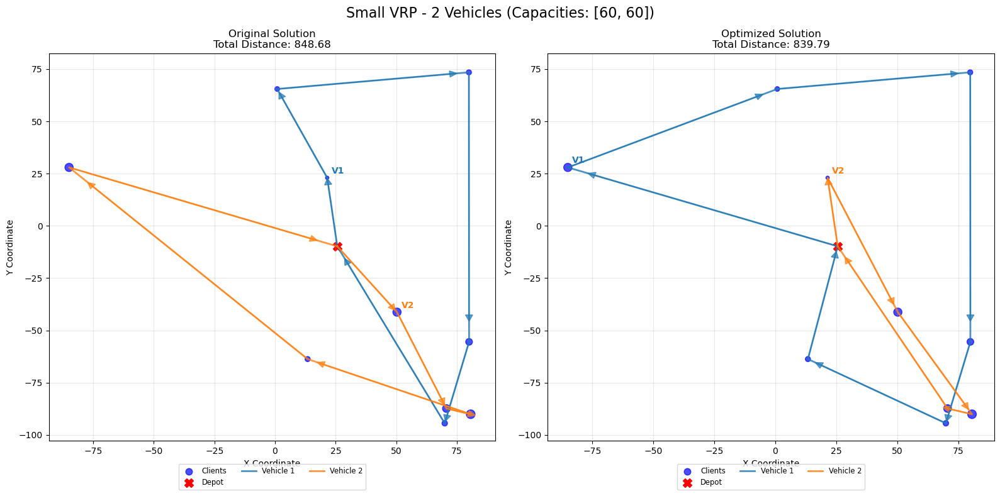


--------------------------------------------------
CONFIGURATION: 3 vehicles
--------------------------------------------------
Reading data for small-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\small-vrp\vrp.csv
Read 10 clients and 1 depot.
Looking for vehicle data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\small-vrp\3.vehicles.csv
Read 3 vehicles from file.
Vehicle capacities: [40, 40, 40]
Solving with 3 vehicles...
Starting LNS with 3 vehicles of capacity 40...
Initial solution distance: 1291.13
  → Forced insertion into Vehicle 1 at position 1
  → New load: 41/40 (102.5%)
Iteration 1: New best distance: 1174.17
  → Forced insertion into Vehicle 1 at position 1
  → New load: 41/40 (102.5%)
Iteration 4: New best distance: 1096.30
Iteration 18: New best distance: 1049.34
Iteration 19: New best

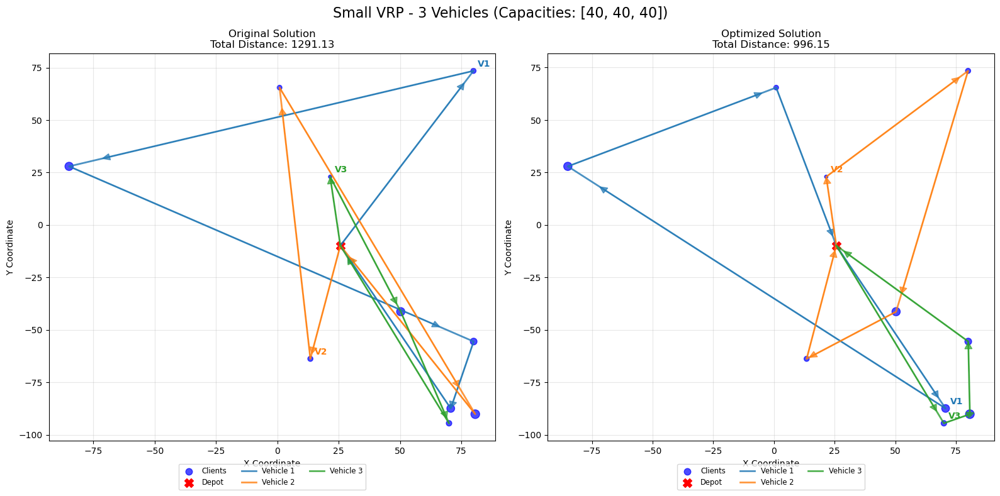


--------------------------------------------------
CONFIGURATION: 4 vehicles
--------------------------------------------------
Reading data for small-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\small-vrp\vrp.csv
Read 10 clients and 1 depot.
Looking for vehicle data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\small-vrp\4.vehicles.csv
Read 4 vehicles from file.
Vehicle capacities: [40, 20, 10, 50]
Solving with 4 vehicles...
Starting LNS with 4 vehicles of capacity 40...
Initial solution distance: 1350.99
Iteration 1: New best distance: 1191.45
  → Forced insertion into Vehicle 2 at position 1
  → New load: 23/20 (115.0%)
Iteration 3: New best distance: 1184.86
  → Forced insertion into Vehicle 2 at position 1
  → New load: 23/20 (115.0%)
Iteration 12: New best distance: 1150.40
Iteration 14: New 

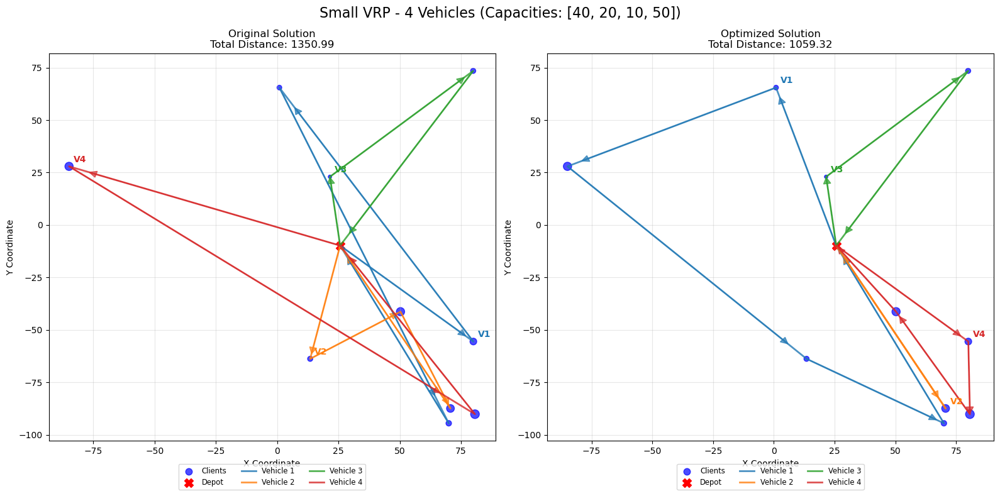



COMPARISON OF ALL CONFIGURATIONS:
Vehicles   Initial Dist    Final Dist      Improvement    
------------------------------------------------------------
2          848.68          839.79          1.05           %
3          1291.13         996.15          22.85          %
4          1350.99         1059.32         21.59          %

Best configuration: 2 vehicles with distance 839.79
Reading data for small-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\small-vrp\vrp.csv
Read 10 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.


,Vehicle Count,Total Distance,Vehicles Used,Capacity Utilization (%)
0,2,839.787610,2,57.500000
1,3,996.146552,3,38.333333
2,4,1059.320579,4,28.750000


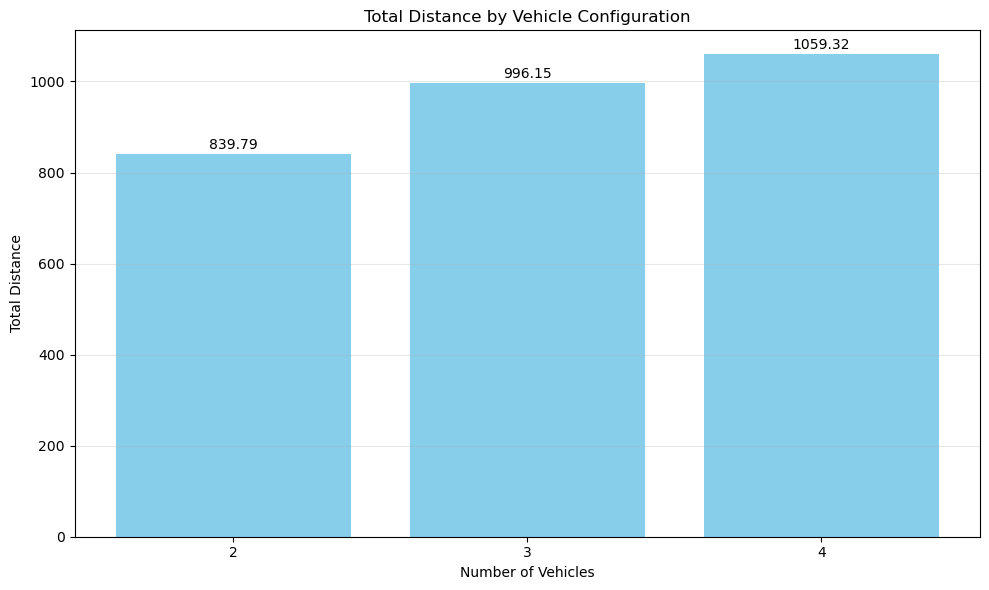

In [25]:
# Run the solver for all configurations
results = solve_small_vrp_with_different_vehicle_counts()

# Create a DataFrame for easier visualization of the comparison
if results:
    # Load the data again to get depot and clients
    depot, clients, _ = read_vrp_data(PROBLEM_SIZE)
    
    comparison_data = []
    for vehicle_count, result in results.items():
        # Create client map for calculations
        client_map = {client["ID"]: client for client in clients}
        client_map[0] = depot
        
        # Calculate capacity utilization
        total_demand = 0
        for vehicle_id, route in result['routes'].items():
            if len(route) > 2:  # Non-empty route
                route_demand = sum(client_map[node_id]["Demand"] for node_id in route if node_id != 0)
                total_demand += route_demand
        
        total_capacity = vehicle_count * 100
        capacity_utilization = (total_demand / total_capacity) * 100
        
        comparison_data.append({
            'Vehicle Count': vehicle_count,
            'Total Distance': result['distance'],
            'Vehicles Used': result['vehicles_used'],
            'Capacity Utilization (%)': capacity_utilization
        })
    
    comparison_df = pd.DataFrame(comparison_data)
    display(comparison_df)
    
    # Visualize the comparison
    plt.figure(figsize=(10, 6))
    plt.bar(comparison_df['Vehicle Count'], comparison_df['Total Distance'], color='skyblue')
    plt.xlabel('Number of Vehicles')
    plt.ylabel('Total Distance')
    plt.title('Total Distance by Vehicle Configuration')
    plt.xticks(comparison_df['Vehicle Count'])
    plt.grid(axis='y', alpha=0.3)
    
    # Add value labels on top of bars
    for i, distance in enumerate(comparison_df['Total Distance']):
        plt.text(comparison_df['Vehicle Count'][i], distance + 5, f'{distance:.2f}', 
                ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()

In [26]:
# Set problem size to medium
PROBLEM_SIZE = "medium"

# LNS parameters - adjusted for medium problem
MAX_ITERATIONS = 300  # Increased for medium problem
MAX_NO_IMPROVEMENT = 70
DESTROY_PERCENTAGE = 0.25

def solve_medium_vrp_with_various_vehicle_counts():
    """
    Solve the medium VRP problem with various numbers of vehicles
    to find the optimal count, all with capacity 100.
    """
    print(f"\n{'='*50}")
    print("SOLVING MEDIUM VRP WITH DIFFERENT VEHICLE COUNTS (CAPACITY=100)")
    print(f"{'='*50}\n")
    
    CAPACITY = 100
    VEHICLE_COUNTS = [6, 7, 8, 9, 10]  # Test more vehicle configurations for medium size
    
    try:
        # Read data
        depot, clients, vehicles = read_vrp_data(PROBLEM_SIZE)
        
        print(f"Problem size: {len(clients)} clients")
        print(f"Total client demand: {sum(c['Demand'] for c in clients)}")
        total_demand = sum(c['Demand'] for c in clients)
        print(f"Minimum theoretical vehicles needed: {total_demand / CAPACITY:.2f}")
        
        # If no vehicles are defined in the data, generate them dynamically
        if not vehicles:
            print("Generating vehicles dynamically...")
            vehicles = [{"Vehicle_ID": i, "Capacity": CAPACITY} for i in range(1, max(VEHICLE_COUNTS) + 1)]
        
        # Results storage
        results = {}
        
        # Solve for each vehicle configuration
        for vehicle_count in VEHICLE_COUNTS:
            print(f"\n{'-'*50}")
            print(f"CONFIGURATION: {vehicle_count} vehicles with capacity {CAPACITY}")
            print(f"{'-'*50}")
            
            # Skip configurations that are clearly insufficient
            if vehicle_count * CAPACITY < total_demand:
                print(f"Skipping - {vehicle_count} vehicles with capacity {CAPACITY} " +
                      f"is insufficient for total demand {total_demand}")
                continue
            
            # Use only the required number of vehicles
            current_vehicles = vehicles[:vehicle_count]
            
            # Solve with Large Neighborhood Search
            lns_routes, lns_distance, initial_routes, initial_distance = large_neighborhood_search(depot, clients, current_vehicles)
            
            # Store results
            results[vehicle_count] = {
                "routes": lns_routes,
                "distance": lns_distance,
                "initial_routes": initial_routes,
                "initial_distance": initial_distance,
                "improvement": (initial_distance - lns_distance) / initial_distance * 100,
                "vehicles_used": sum(1 for route in lns_routes.values() if len(route) > 2)
            }
            
            # Report solution details
            client_map = {client["ID"]: client for client in clients}
            client_map[0] = depot
            report_solution(depot, clients, lns_routes, client_map, vehicle_count, CAPACITY, initial_routes)
        
        # Compare all configurations
        compare_results(results)
        
        return results
    
    except Exception as e:
        print(f"Error solving medium VRP: {e}")
        import traceback
        traceback.print_exc()
        return None
    

def compare_results_with_validation(results, valid_results):
    """Compare and visualize results from different vehicle counts, highlighting valid solutions."""
    print("\n\nCOMPARISON OF ALL CONFIGURATIONS:")
    print(f"{'Vehicles':<10} {'Distance':<15} {'Vehicles Used':<15} {'Clients Visited':<15} {'Valid':<10}")
    print(f"{'-'*65}")
    
    for vehicle_count, result in sorted(results.items()):
        valid_mark = "✓" if result["all_clients_visited"] else "✗"
        print(f"{vehicle_count:<10} {result['distance']:<15.2f} {result['vehicles_used']:<15} "
              f"{result['clients_visited']}/{result['total_clients']:<10} {valid_mark}")
    
    # Find best valid configuration
    if valid_results:
        best_valid_config = min(valid_results.items(), key=lambda x: x[1]['distance'])
        print(f"\nBest VALID configuration: {best_valid_config[0]} vehicles with distance {best_valid_config[1]['distance']:.2f}")
    else:
        print("\nNo valid configurations found! Increase vehicle count or capacity.")
    
    # Create visualization with color-coding for valid/invalid
    comparison_data = []
    for vehicle_count, result in results.items():
        comparison_data.append({
            'Vehicle Count': vehicle_count,
            'Total Distance': result['distance'],
            'Vehicles Used': result['vehicles_used'],
            'Valid': result['all_clients_visited'],
            'Clients Visited': f"{result['clients_visited']}/{result['total_clients']}"
        })
    
    comparison_df = pd.DataFrame(comparison_data)
    display(comparison_df)
    
    # Plot comparison with color coding
    plt.figure(figsize=(12, 6))
    
    # Create color map based on validity
    colors = ['lightcoral' if not row['Valid'] else 'skyblue' 
              for _, row in comparison_df.iterrows()]
    
    bars = plt.bar(comparison_df['Vehicle Count'], comparison_df['Total Distance'], color=colors)
    plt.xlabel('Number of Vehicles')
    plt.ylabel('Total Distance')
    plt.title('Total Distance by Vehicle Configuration (Red = Invalid Solution)')
    plt.xticks(comparison_df['Vehicle Count'])
    plt.grid(axis='y', alpha=0.3)
    
    # Add value labels on top of bars with validity information
    for i, (_, row) in enumerate(comparison_df.iterrows()):
        visited_info = row['Clients Visited']
        distance = row['Total Distance']
        plt.text(row['Vehicle Count'], distance + 5, 
                f"{distance:.2f}\n({visited_info})", 
                ha='center', va='bottom')
    
    # Add a legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='skyblue', label='Valid Solution (All Clients)'),
        Patch(facecolor='lightcoral', label='Invalid Solution (Missing Clients)')
    ]
    plt.legend(handles=legend_elements)
    
    plt.tight_layout()
    plt.show()

In [27]:
def solve_medium_vrp_with_various_capacities():
    """
    Solve the medium VRP problem with 4 vehicles and varying capacities
    to find the optimal capacity.
    """
    print(f"\n{'='*50}")
    print("SOLVING MEDIUM VRP WITH 4 VEHICLES AND DIFFERENT CAPACITIES")
    print(f"{'='*50}\n")
    
    VEHICLE_COUNT = 4
    # Test different capacities
    CAPACITIES = [150, 160, 170, 180]
    
    try:
        # Read data
        depot, clients, _ = read_vrp_data(PROBLEM_SIZE)
        
        print(f"Problem size: {len(clients)} clients")
        print(f"Total client demand: {sum(c['Demand'] for c in clients)}")
        total_demand = sum(c['Demand'] for c in clients)
        min_capacity = total_demand / VEHICLE_COUNT
        print(f"Minimum theoretical capacity needed: {min_capacity:.2f}")
        
        # Results storage
        results = {}
        
        # Solve for each capacity
        for capacity in CAPACITIES:
            print(f"\n{'-'*50}")
            print(f"CONFIGURATION: {VEHICLE_COUNT} vehicles with capacity {capacity}")
            print(f"{'-'*50}")
            
            # Skip if capacity is clearly insufficient
            if capacity * VEHICLE_COUNT < total_demand:
                print(f"Capacity {capacity} is insufficient for total demand {total_demand}")
                continue
            
            # Create vehicles with the specified configuration
            vehicles = [
                {"Vehicle_ID": i, "Capacity": capacity}
                for i in range(1, VEHICLE_COUNT + 1)
            ]
            
            # Solve with Large Neighborhood Search - now unpack 4 values
            lns_routes, lns_distance, initial_routes, initial_distance = large_neighborhood_search(depot, clients, vehicles)
            
            # Store results with improvement metric
            results[capacity] = {
                "routes": lns_routes,
                "distance": lns_distance,
                "initial_routes": initial_routes,
                "initial_distance": initial_distance,
                "improvement": (initial_distance - lns_distance) / initial_distance * 100,
                "vehicles_used": sum(1 for route in lns_routes.values() if len(route) > 2)
            }
            
            # Create client map for calculations
            client_map = {client["ID"]: client for client in clients}
            client_map[0] = depot
            
            # Report vehicle usage and plot solution with comparison
            report_solution(depot, clients, lns_routes, client_map, VEHICLE_COUNT, capacity, initial_routes)
            
            # Report improvement percentage
            print(f"\nSolution improvement: {results[capacity]['improvement']:.2f}%")
        
        # Compare all configurations
        compare_capacity_results(results)
        
        return results
    
    except Exception as e:
        print(f"Error solving medium VRP: {e}")
        import traceback
        traceback.print_exc()
        return None

In [28]:
def solve_medium_vrp_with_capacity_150():
    """
    Solve the medium VRP problem with capacity 150 and various vehicle counts
    to find the minimum number of vehicles needed.
    """
    print(f"\n{'='*50}")
    print("SOLVING MEDIUM VRP WITH CAPACITY 150 AND DIFFERENT VEHICLE COUNTS")
    print(f"{'='*50}\n")
    
    CAPACITY = 150
    # Start with fewer vehicles for capacity 150
    VEHICLE_COUNTS = [4, 5, 6, 7]
    
    try:
        # Read data
        depot, clients, _ = read_vrp_data(PROBLEM_SIZE)
        
        print(f"Problem size: {len(clients)} clients")
        print(f"Total client demand: {sum(c['Demand'] for c in clients)}")
        total_demand = sum(c['Demand'] for c in clients)
        min_vehicles = total_demand / CAPACITY
        print(f"Minimum theoretical vehicles needed: {min_vehicles:.2f}")
        
        # Results storage
        results = {}
        
        # Solve for each vehicle count
        for vehicle_count in VEHICLE_COUNTS:
            print(f"\n{'-'*50}")
            print(f"CONFIGURATION: {vehicle_count} vehicles with capacity {CAPACITY}")
            print(f"{'-'*50}")
            
            # Skip if clearly insufficient
            if CAPACITY * vehicle_count < total_demand:
                print(f"{vehicle_count} vehicles with capacity {CAPACITY} is insufficient for " + 
                      f"total demand {total_demand}")
                continue
            
            # Create vehicles with the specified configuration
            vehicles = [
                {"Vehicle_ID": i, "Capacity": CAPACITY}
                for i in range(1, vehicle_count + 1)
            ]
            
            # Solve with Large Neighborhood Search - now unpack 4 values
            lns_routes, lns_distance, initial_routes, initial_distance = large_neighborhood_search(depot, clients, vehicles)
            
            # Store results with improvement metric
            results[vehicle_count] = {
                "routes": lns_routes,
                "distance": lns_distance,
                "initial_routes": initial_routes,
                "initial_distance": initial_distance,
                "improvement": (initial_distance - lns_distance) / initial_distance * 100,
                "vehicles_used": sum(1 for route in lns_routes.values() if len(route) > 2)
            }
            
            # Create client map for calculations
            client_map = {client["ID"]: client for client in clients}
            client_map[0] = depot
            
            # Report vehicle usage and plot solution with comparison
            report_solution(depot, clients, lns_routes, client_map, vehicle_count, CAPACITY, initial_routes)
            
            # Report improvement percentage
            print(f"\nSolution improvement: {results[vehicle_count]['improvement']:.2f}%")
        
        # Compare all configurations
        compare_results(results)
        
        return results
    
    except Exception as e:
        print(f"Error solving medium VRP: {e}")
        import traceback
        traceback.print_exc()
        return None

In [29]:
def report_solution(depot, clients, routes, client_map, vehicle_count, capacity, initial_routes=None):
    """Report vehicle usage and plot the solution with comparison to initial solution if available."""
    print("\nVehicle usage:")
    used_vehicles = 0
    total_distance = 0
    
    for vehicle_id, route in routes.items():
        if len(route) <= 2:  # Empty route
            continue
            
        used_vehicles += 1
        route_demand = sum(client_map[node_id]["Demand"] for node_id in route if node_id != 0)
        route_distance = calculate_route_distance(route, client_map)
        total_distance += route_distance
        client_count = len(route) - 2  # Subtract 2 for depot at start and end
        
        print(f"Vehicle {vehicle_id}: {client_count} clients, " + 
              f"demand: {route_demand}/{capacity} " +
              f"({route_demand/capacity*100:.1f}%), distance: {route_distance:.2f}")
    
    print(f"\nTotal vehicles used: {used_vehicles} out of {vehicle_count}")
    print(f"Total distance: {total_distance:.2f}")
    
    # Show comparison if initial solution is provided
    if initial_routes:
        initial_distance = calculate_total_distance(initial_routes, client_map)
        improvement = (initial_distance - total_distance) / initial_distance * 100
        print(f"\nInitial solution distance: {initial_distance:.2f}")
        print(f"Optimized solution distance: {total_distance:.2f}")
        print(f"Improvement: {improvement:.2f}%")
        
        # Plot solution with side-by-side comparison
        plot_title = f"{PROBLEM_SIZE.capitalize()} VRP - {vehicle_count} Vehicles (Capacity: {capacity})"
        plot_vrp_solution(depot, clients, routes, title=plot_title, compare_original=initial_routes)
    else:
        # Plot only the optimized solution
        plot_title = f"{PROBLEM_SIZE.capitalize()} VRP - {vehicle_count} Vehicles (Capacity: {capacity})"
        plot_vrp_solution(depot, clients, routes, title=plot_title)

def compare_results(results):
    """Compare and visualize results from different vehicle counts, including improvement metrics."""
    print("\n\nCOMPARISON OF ALL CONFIGURATIONS:")
    print(f"{'Vehicles':<10} {'Initial Dist':<15} {'Final Dist':<15} {'Improvement (%)':<15} {'Vehicles Used':<15}")
    print(f"{'-'*70}")
    
    for vehicle_count, result in sorted(results.items()):
        improvement = result.get('improvement', 0)
        print(f"{vehicle_count:<10} {result['initial_distance']:<15.2f} {result['distance']:<15.2f} "
              f"{improvement:<15.2f} {result['vehicles_used']:<15}")
    
    # Find best configuration
    best_config = min(results.items(), key=lambda x: x[1]['distance'])
    print(f"\nBest configuration: {best_config[0]} vehicles with distance {best_config[1]['distance']:.2f}")
    
    # Create visualization
    comparison_data = []
    for vehicle_count, result in results.items():
        comparison_data.append({
            'Vehicle Count': vehicle_count,
            'Initial Distance': result['initial_distance'],
            'Final Distance': result['distance'],
            'Improvement (%)': result['improvement'],
            'Vehicles Used': result['vehicles_used']
        })
    
    comparison_df = pd.DataFrame(comparison_data)
    display(comparison_df)
    
    # Plot comparison
    plt.figure(figsize=(12, 6))
    x = np.arange(len(comparison_df['Vehicle Count']))
    width = 0.35
    
    # Create side-by-side bars for initial and final distances
    plt.bar(x - width/2, comparison_df['Initial Distance'], width, label='Initial Distance', color='lightgray')
    plt.bar(x + width/2, comparison_df['Final Distance'], width, label='Final Distance', color='skyblue')
    
    plt.xlabel('Number of Vehicles')
    plt.ylabel('Total Distance')
    plt.title('Initial vs. Final Distance by Vehicle Configuration')
    plt.xticks(x, comparison_df['Vehicle Count'])
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, row in comparison_df.iterrows():
        plt.text(i - width/2, row['Initial Distance'] + 5, f"{row['Initial Distance']:.2f}", ha='center', va='bottom')
        plt.text(i + width/2, row['Final Distance'] + 5, f"{row['Final Distance']:.2f}\n(-{row['Improvement (%)']:.1f}%)",
                 ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()

def compare_capacity_results(results):
    """Compare and visualize results from different capacities, including improvement metrics."""
    print("\n\nCOMPARISON OF ALL CAPACITY CONFIGURATIONS:")
    print(f"{'Capacity':<10} {'Initial Dist':<15} {'Final Dist':<15} {'Improvement (%)':<15} {'Vehicles Used':<15}")
    print(f"{'-'*70}")
    
    for capacity, result in sorted(results.items()):
        improvement = result.get('improvement', 0)
        print(f"{capacity:<10} {result['initial_distance']:<15.2f} {result['distance']:<15.2f} "
              f"{improvement:<15.2f} {result['vehicles_used']:<15}")
    
    # Find best configuration
    best_config = min(results.items(), key=lambda x: x[1]['distance'])
    print(f"\nBest configuration: Capacity {best_config[0]} with distance {best_config[1]['distance']:.2f}")
    
    # Create visualization
    comparison_data = []
    for capacity, result in results.items():
        comparison_data.append({
            'Capacity': capacity,
            'Initial Distance': result['initial_distance'],
            'Final Distance': result['distance'],
            'Improvement (%)': result['improvement'],
            'Vehicles Used': result['vehicles_used']
        })
    
    comparison_df = pd.DataFrame(comparison_data)
    display(comparison_df)
    
    # Plot comparison
    plt.figure(figsize=(12, 6))
    x = np.arange(len(comparison_df['Capacity']))
    width = 0.35
    
    # Create side-by-side bars for initial and final distances
    plt.bar(x - width/2, comparison_df['Initial Distance'], width, label='Initial Distance', color='lightgray')
    plt.bar(x + width/2, comparison_df['Final Distance'], width, label='Final Distance', color='lightgreen')
    
    plt.xlabel('Vehicle Capacity')
    plt.ylabel('Total Distance')
    plt.title('Initial vs. Final Distance by Vehicle Capacity')
    plt.xticks(x, comparison_df['Capacity'])
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, row in comparison_df.iterrows():
        plt.text(i - width/2, row['Initial Distance'] + 5, f"{row['Initial Distance']:.2f}", ha='center', va='bottom')
        plt.text(i + width/2, row['Final Distance'] + 5, f"{row['Final Distance']:.2f}\n(-{row['Improvement (%)']:.1f}%)",
                 ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()


SOLVING MEDIUM VRP WITH DIFFERENT VEHICLE COUNTS (CAPACITY=100)

Reading data for medium-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\medium-vrp\vrp.csv
Read 49 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Problem size: 49 clients
Total client demand: 619
Minimum theoretical vehicles needed: 6.19
Generating vehicles dynamically...

--------------------------------------------------
CONFIGURATION: 6 vehicles with capacity 100
--------------------------------------------------
Skipping - 6 vehicles with capacity 100 is insufficient for total demand 619

--------------------------------------------------
CONFIGURATION: 7 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 7 vehicles of capacity 100...
Initial solution distance: 3364.30
Iteration 1: New best distance: 274

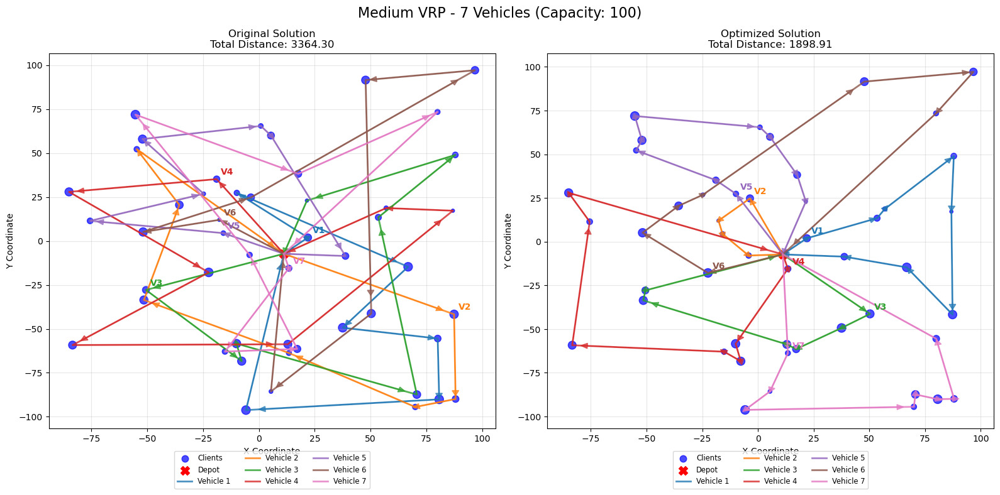


--------------------------------------------------
CONFIGURATION: 8 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 8 vehicles of capacity 100...
Initial solution distance: 3822.73
Iteration 1: New best distance: 3166.97
Iteration 2: New best distance: 2824.37
Iteration 3: New best distance: 2584.71
Iteration 4: New best distance: 2295.13
Iteration 5: New best distance: 2237.65
Iteration 6: New best distance: 2103.02
Iteration 8: New best distance: 2084.44
Iteration 9: New best distance: 2009.08
Iteration 11: New best distance: 1978.17
Iteration 12: New best distance: 1962.28
Iteration 13: New best distance: 1957.50
Iteration 14: New best distance: 1956.96
Iteration 15: New best distance: 1954.43
Iteration 16: New best distance: 1947.95
Iteration 19: New best distance: 1929.42
Iteration 21: New best distance: 1925.12
Iteration 24: New best distance: 1898.65
Iteration 30: New best distance: 1863.37
Iteration 33: New best distance: 1859.00

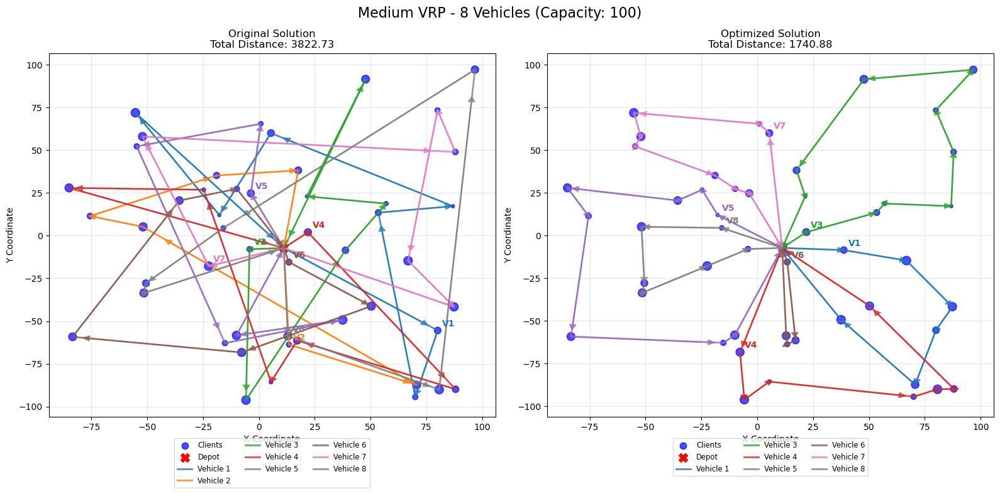


--------------------------------------------------
CONFIGURATION: 9 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 9 vehicles of capacity 100...
Initial solution distance: 4072.37
Iteration 1: New best distance: 3247.16
Iteration 2: New best distance: 2982.05
Iteration 3: New best distance: 2822.06
Iteration 4: New best distance: 2542.89
Iteration 5: New best distance: 2485.86
Iteration 6: New best distance: 2443.82
Iteration 7: New best distance: 2312.39
Iteration 8: New best distance: 2252.85
Iteration 9: New best distance: 2061.24
Iteration 10: New best distance: 2038.75
Iteration 12: New best distance: 1937.68
Iteration 13: New best distance: 1910.90
Iteration 15: New best distance: 1871.89
Iteration 16: New best distance: 1856.93
Iteration 17: New best distance: 1840.26
Iteration 18: New best distance: 1802.96
Iteration 22: New best distance: 1778.43
Iteration 23: New best distance: 1777.00
Iteration 37: New best distance: 1770.01


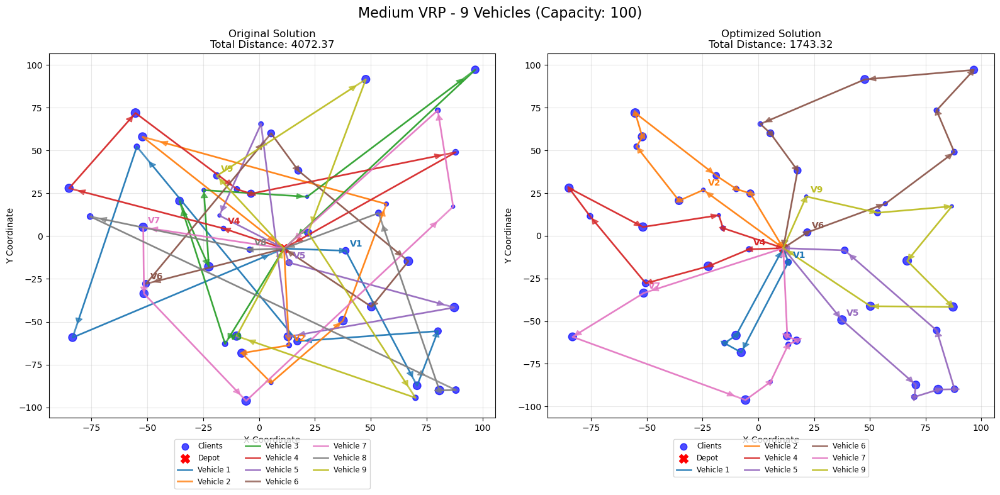


--------------------------------------------------
CONFIGURATION: 10 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 10 vehicles of capacity 100...
Initial solution distance: 4289.34
Iteration 1: New best distance: 3509.95
Iteration 2: New best distance: 3253.43
Iteration 3: New best distance: 2957.35
Iteration 4: New best distance: 2736.02
Iteration 5: New best distance: 2420.63
Iteration 6: New best distance: 2328.04
Iteration 9: New best distance: 2160.77
Iteration 10: New best distance: 2159.76
Iteration 11: New best distance: 2154.93
Iteration 12: New best distance: 2147.20
Iteration 15: New best distance: 2092.13
Iteration 16: New best distance: 2037.32
Iteration 17: New best distance: 2014.95
Iteration 24: New best distance: 2014.73
Iteration 30: New best distance: 1999.99
Iteration 31: New best distance: 1961.74
Iteration 32: New best distance: 1867.15
Iteration 39: New best distance: 1851.74
Iteration 42: New best distance: 1847

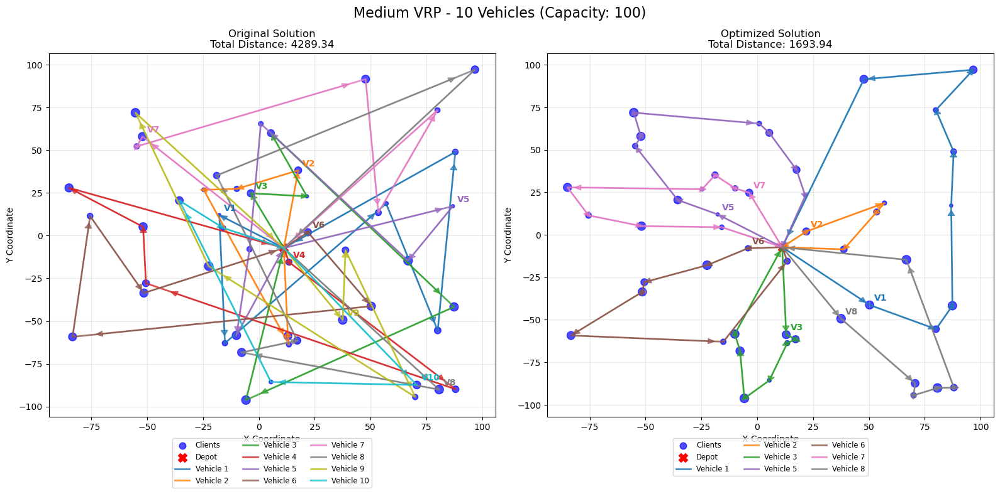



COMPARISON OF ALL CONFIGURATIONS:
Vehicles   Initial Dist    Final Dist      Improvement (%) Vehicles Used  
----------------------------------------------------------------------
7          3364.30         1898.91         43.56           7              
8          3822.73         1740.88         54.46           7              
9          4072.37         1743.32         57.19           7              
10         4289.34         1693.94         60.51           7              

Best configuration: 10 vehicles with distance 1693.94


,Vehicle Count,Initial Distance,Final Distance,Improvement (%),Vehicles Used
0,7,3364.300235,1898.905112,43.557204,7
1,8,3822.725313,1740.878011,54.459767,7
2,9,4072.373020,1743.318401,57.191584,7
3,10,4289.337458,1693.936153,60.508210,7


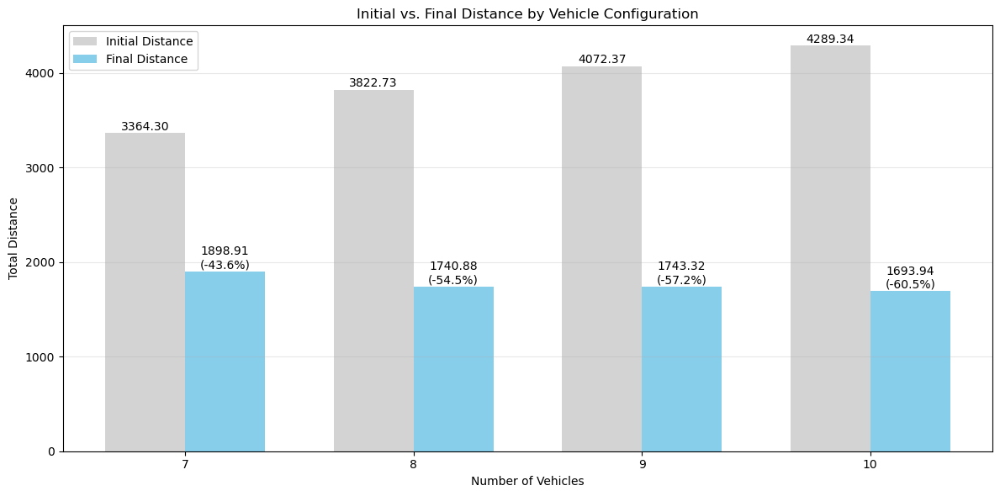


SOLVING MEDIUM VRP WITH 4 VEHICLES AND DIFFERENT CAPACITIES

Reading data for medium-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\medium-vrp\vrp.csv
Read 49 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Problem size: 49 clients
Total client demand: 619
Minimum theoretical capacity needed: 154.75

--------------------------------------------------
CONFIGURATION: 4 vehicles with capacity 150
--------------------------------------------------
Capacity 150 is insufficient for total demand 619

--------------------------------------------------
CONFIGURATION: 4 vehicles with capacity 160
--------------------------------------------------
Starting LNS with 4 vehicles of capacity 160...
Initial solution distance: 2766.83
Iteration 1: New best distance: 2569.48
Iteration 2: New best distance: 2322.81
Iteration 3: New be

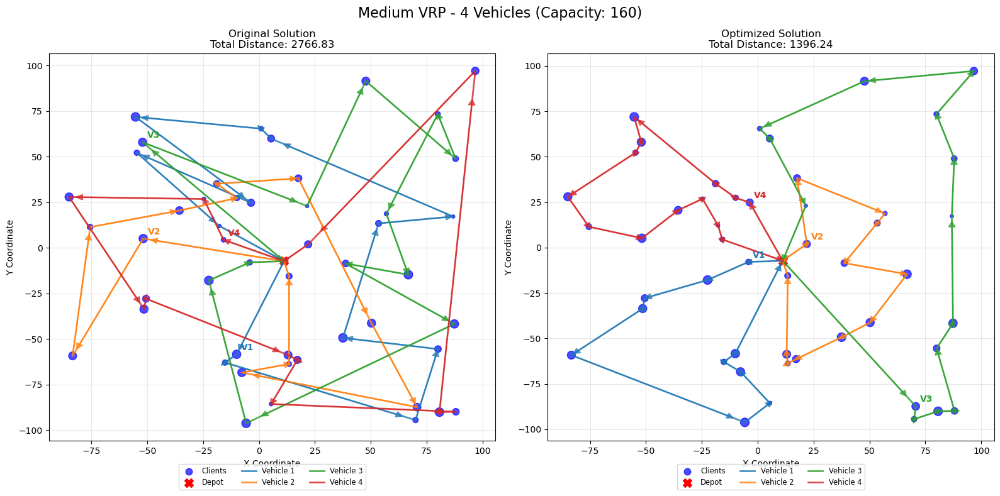


Solution improvement: 49.54%

--------------------------------------------------
CONFIGURATION: 4 vehicles with capacity 170
--------------------------------------------------
Starting LNS with 4 vehicles of capacity 170...
Initial solution distance: 2766.83
Iteration 1: New best distance: 2091.16
Iteration 2: New best distance: 1976.68
Iteration 3: New best distance: 1891.56
Iteration 4: New best distance: 1857.39
Iteration 5: New best distance: 1805.40
Iteration 8: New best distance: 1723.06
Iteration 10: New best distance: 1701.41
Iteration 11: New best distance: 1651.58
Iteration 12: New best distance: 1636.99
Iteration 15: New best distance: 1595.68
Iteration 16: New best distance: 1574.12
Iteration 17: New best distance: 1572.17
Iteration 19: New best distance: 1571.66
Iteration 22: New best distance: 1561.99
Iteration 24: New best distance: 1543.44
Iteration 26: New best distance: 1449.56
Iteration 28: New best distance: 1435.68
Iteration 30: New best distance: 1409.57
Iteratio

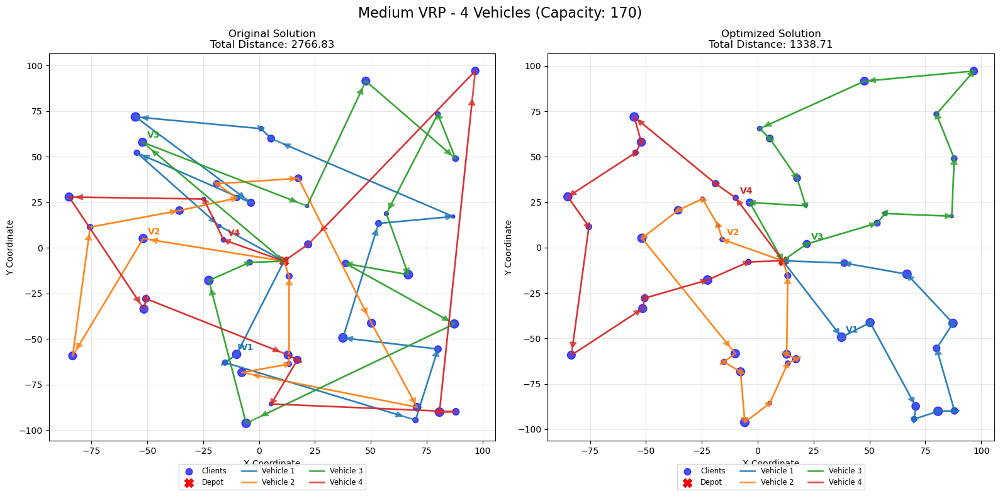


Solution improvement: 51.62%

--------------------------------------------------
CONFIGURATION: 4 vehicles with capacity 180
--------------------------------------------------
Starting LNS with 4 vehicles of capacity 180...
Initial solution distance: 2766.83
Iteration 1: New best distance: 2407.93
Iteration 2: New best distance: 1949.70
Iteration 4: New best distance: 1870.98
Iteration 5: New best distance: 1819.01
Iteration 6: New best distance: 1804.01
Iteration 7: New best distance: 1789.73
Iteration 8: New best distance: 1785.81
Iteration 10: New best distance: 1713.03
Iteration 11: New best distance: 1682.15
Iteration 12: New best distance: 1665.55
Iteration 14: New best distance: 1653.01
Iteration 18: New best distance: 1625.43
Iteration 19: New best distance: 1601.77
Iteration 21: New best distance: 1567.43
Iteration 22: New best distance: 1551.12
Iteration 24: New best distance: 1527.82
Iteration 33: New best distance: 1518.03
Iteration 42: New best distance: 1516.56
Iteration

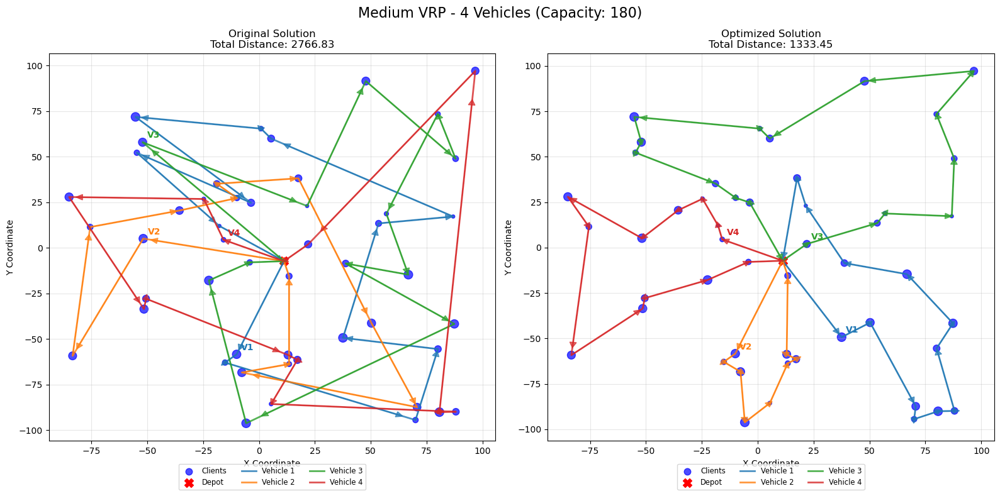


Solution improvement: 51.81%


COMPARISON OF ALL CAPACITY CONFIGURATIONS:
Capacity   Initial Dist    Final Dist      Improvement (%) Vehicles Used  
----------------------------------------------------------------------
160        2766.83         1396.24         49.54           4              
170        2766.83         1338.71         51.62           4              
180        2766.83         1333.45         51.81           4              

Best configuration: Capacity 180 with distance 1333.45


,Capacity,Initial Distance,Final Distance,Improvement (%),Vehicles Used
0,160,2766.83026,1396.236875,49.536591,4
1,170,2766.83026,1338.705721,51.615907,4
2,180,2766.83026,1333.453221,51.805745,4


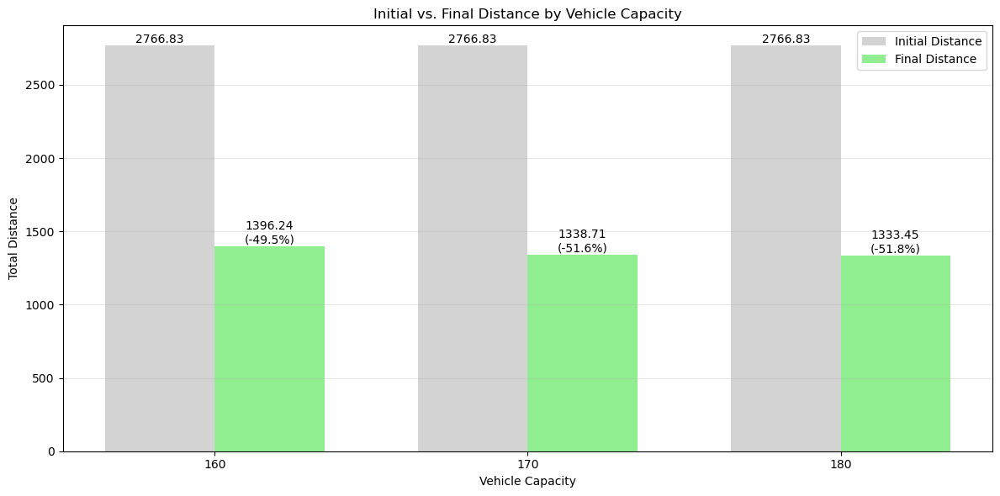


SOLVING MEDIUM VRP WITH CAPACITY 150 AND DIFFERENT VEHICLE COUNTS

Reading data for medium-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\medium-vrp\vrp.csv
Read 49 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Problem size: 49 clients
Total client demand: 619
Minimum theoretical vehicles needed: 4.13

--------------------------------------------------
CONFIGURATION: 4 vehicles with capacity 150
--------------------------------------------------
4 vehicles with capacity 150 is insufficient for total demand 619

--------------------------------------------------
CONFIGURATION: 5 vehicles with capacity 150
--------------------------------------------------
Starting LNS with 5 vehicles of capacity 150...
Initial solution distance: 2869.18
Iteration 1: New best distance: 2536.56
Iteration 2: New best distance: 2443.88

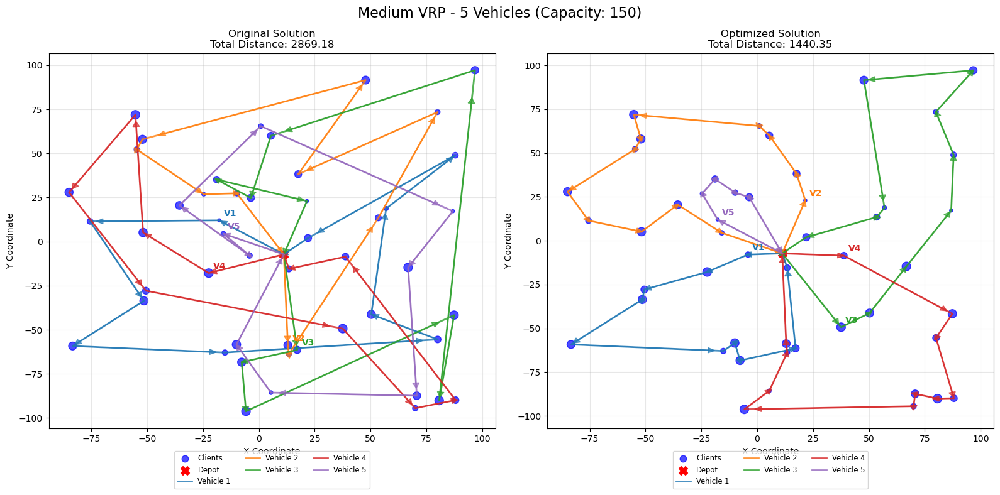


Solution improvement: 49.80%

--------------------------------------------------
CONFIGURATION: 6 vehicles with capacity 150
--------------------------------------------------
Starting LNS with 6 vehicles of capacity 150...
Initial solution distance: 2997.33
Iteration 1: New best distance: 2768.00
Iteration 2: New best distance: 2508.04
Iteration 3: New best distance: 2435.13
Iteration 4: New best distance: 2321.34
Iteration 5: New best distance: 2315.65
Iteration 6: New best distance: 2276.90
Iteration 7: New best distance: 2164.42
Iteration 8: New best distance: 2095.94
Iteration 9: New best distance: 2066.00
Iteration 11: New best distance: 2051.75
Iteration 12: New best distance: 2026.80
Iteration 13: New best distance: 2010.20
Iteration 14: New best distance: 2006.95
Iteration 15: New best distance: 1941.94
Iteration 16: New best distance: 1878.58
Iteration 17: New best distance: 1822.07
Iteration 18: New best distance: 1771.34
Iteration 19: New best distance: 1768.77
Iteration 2

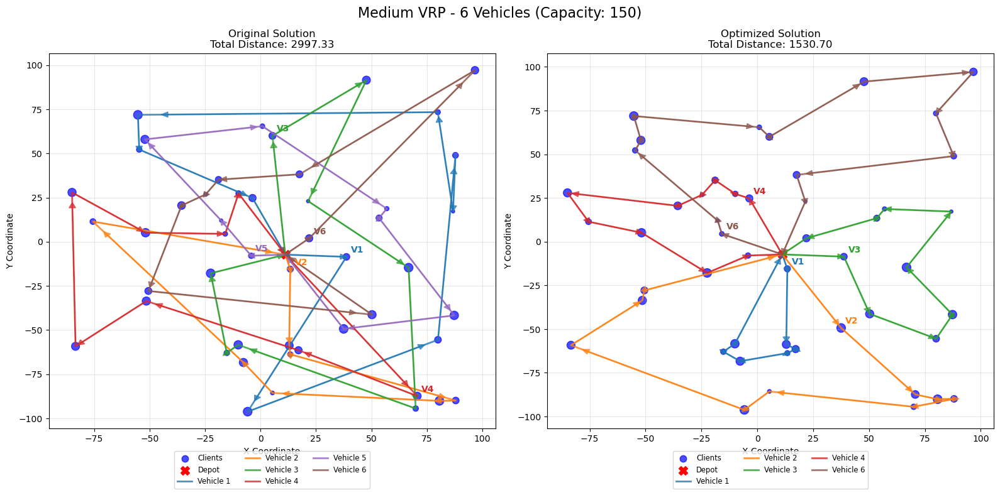


Solution improvement: 48.93%

--------------------------------------------------
CONFIGURATION: 7 vehicles with capacity 150
--------------------------------------------------
Starting LNS with 7 vehicles of capacity 150...
Initial solution distance: 3364.30
Iteration 1: New best distance: 2958.44
Iteration 2: New best distance: 2673.11
Iteration 3: New best distance: 2454.14
Iteration 4: New best distance: 2247.57
Iteration 5: New best distance: 2084.23
Iteration 6: New best distance: 2042.30
Iteration 7: New best distance: 1891.08
Iteration 10: New best distance: 1820.54
Iteration 11: New best distance: 1787.82
Iteration 14: New best distance: 1773.78
Iteration 17: New best distance: 1771.47
Iteration 20: New best distance: 1766.39
Iteration 22: New best distance: 1667.14
Iteration 25: New best distance: 1666.91
Iteration 26: New best distance: 1631.00
Iteration 27: New best distance: 1622.13
Iteration 28: New best distance: 1620.85
Iteration 30: New best distance: 1606.86
Iteration

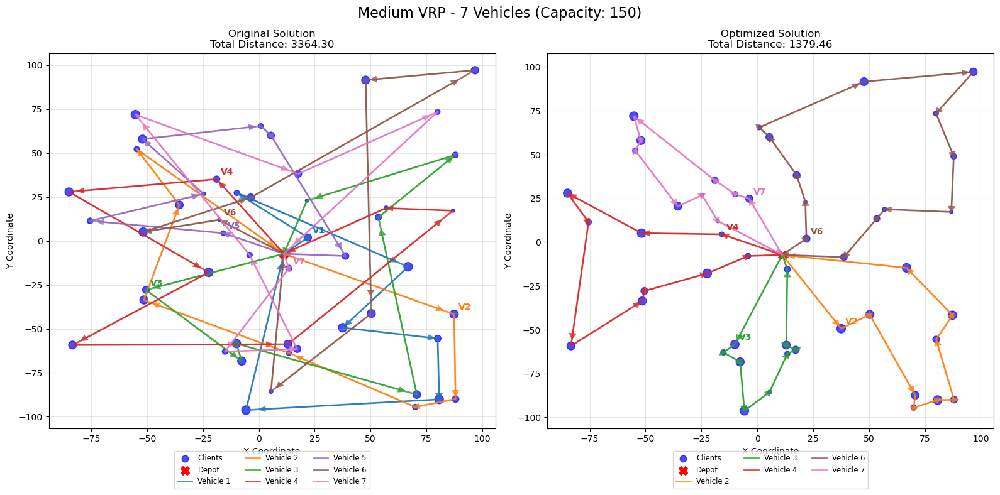


Solution improvement: 59.00%


COMPARISON OF ALL CONFIGURATIONS:
Vehicles   Initial Dist    Final Dist      Improvement (%) Vehicles Used  
----------------------------------------------------------------------
5          2869.18         1440.35         49.80           5              
6          2997.33         1530.70         48.93           5              
7          3364.30         1379.46         59.00           5              

Best configuration: 7 vehicles with distance 1379.46


,Vehicle Count,Initial Distance,Final Distance,Improvement (%),Vehicles Used
0,5,2869.180751,1440.345790,49.799406,5
1,6,2997.331374,1530.704769,48.931080,5
2,7,3364.300235,1379.461414,58.997078,5


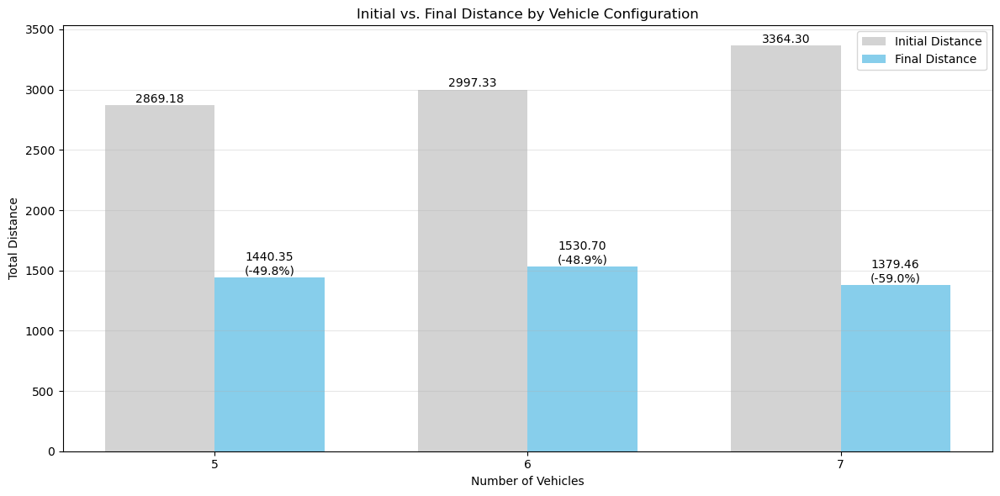

In [30]:
# Scenario A: Find optimal vehicle count with capacity 100
results_a = solve_medium_vrp_with_various_vehicle_counts()

# Scenario B: Find optimal capacity with 4 vehicles
results_b = solve_medium_vrp_with_various_capacities()

# Scenario C: Find minimum vehicle count with capacity 150
results_c = solve_medium_vrp_with_capacity_150()

In [31]:
# Set problem size to large
PROBLEM_SIZE = "large"

# LNS parameters - adjusted for large problem
MAX_ITERATIONS = 500  # Increased for large problem
MAX_NO_IMPROVEMENT = 100
DESTROY_PERCENTAGE = 0.3  # Slightly higher for more solution diversity

def solve_large_vrp_with_various_vehicle_counts():
    """
    Solve the large VRP problem with various numbers of vehicles
    to find the optimal count, all with capacity 100.
    Compare initial solution with optimized solution.
    """
    print(f"\n{'='*50}")
    print("SOLVING LARGE VRP WITH DIFFERENT VEHICLE COUNTS (CAPACITY=100)")
    print(f"{'='*50}\n")
    
    CAPACITY = 100
    # Test various vehicle configurations
    VEHICLE_COUNTS = [11, 12, 14, 16, 18]
    
    try:
        # Read data
        depot, clients, _ = read_vrp_data(PROBLEM_SIZE)
        
        print(f"Problem size: {len(clients)} clients")
        print(f"Total client demand: {sum(c['Demand'] for c in clients)}")
        total_demand = sum(c['Demand'] for c in clients)
        print(f"Minimum theoretical vehicles needed: {total_demand/CAPACITY:.2f}")
        
        # Results storage
        results = {}
        valid_results = {}  # Store only valid results
        
        # Solve for each vehicle configuration
        for vehicle_count in VEHICLE_COUNTS:
            print(f"\n{'-'*50}")
            print(f"CONFIGURATION: {vehicle_count} vehicles with capacity {CAPACITY}")
            print(f"{'-'*50}")
            
            # Skip configurations that are clearly insufficient
            if vehicle_count * CAPACITY < total_demand:
                print(f"Skipping - {vehicle_count} vehicles with capacity {CAPACITY} " +
                      f"is insufficient for total demand {total_demand}")
                continue
            
            # Create vehicles with the specified configuration
            vehicles = [
                {"Vehicle_ID": i, "Capacity": CAPACITY}
                for i in range(1, vehicle_count + 1)
            ]
            
            # Solve with Large Neighborhood Search - now returns initial solution as well
            lns_routes, lns_distance, initial_routes, initial_distance = large_neighborhood_search(depot, clients, vehicles)
            
            # Create client map for calculations
            client_map = {client["ID"]: client for client in clients}
            client_map[0] = depot
            
            # Validate if all clients are visited
            clients_in_solution = set()
            for route in lns_routes.values():
                for node_id in route:
                    if node_id != 0:  # Skip depot
                        clients_in_solution.add(node_id)
            
            all_clients_visited = len(clients_in_solution) == len(clients)
            
            # Store results with improvement metric
            results[vehicle_count] = {
                "routes": lns_routes,
                "distance": lns_distance,
                "initial_routes": initial_routes,
                "initial_distance": initial_distance,
                "improvement": (initial_distance - lns_distance) / initial_distance * 100,
                "vehicles_used": sum(1 for route in lns_routes.values() if len(route) > 2),
                "all_clients_visited": all_clients_visited,
                "clients_visited": len(clients_in_solution),
                "total_clients": len(clients),
                "capacity_utilization": calculate_capacity_utilization(lns_routes, client_map, vehicle_count, CAPACITY)
            }
            
            # Only consider valid solutions for best configuration
            if all_clients_visited:
                valid_results[vehicle_count] = results[vehicle_count]
            
            # Report solution details including validation
            print(f"\nClients visited: {len(clients_in_solution)}/{len(clients)}")
            if not all_clients_visited:
                print(f"WARNING: Not all clients are visited in this solution!")
                # Print which clients are missing
                missing_clients = set(client["ID"] for client in clients) - clients_in_solution
                print(f"Missing clients: {missing_clients}")
            
            # Report vehicle usage and plot solution with comparison
            report_solution(depot, clients, lns_routes, client_map, vehicle_count, CAPACITY, initial_routes)
            
            # Report improvement percentage
            print(f"\nSolution improvement: {results[vehicle_count]['improvement']:.2f}%")
        
        # Compare all configurations, highlighting invalid solutions
        compare_large_results(results, valid_results)
        
        # Calculate efficiency metric
        analyze_vehicle_efficiency(results)
        
        return results, valid_results
    
    except Exception as e:
        print(f"Error solving large VRP: {e}")
        import traceback
        traceback.print_exc()
        return None, None

def calculate_capacity_utilization(routes, client_map, vehicle_count, capacity):
    """Calculate the capacity utilization across all vehicles."""
    # Calculate total demand across all routes
    total_demand = 0
    for route in routes.values():
        route_demand = sum(client_map[node_id]["Demand"] for node_id in route if node_id != 0)
        total_demand += route_demand
    
    total_capacity = vehicle_count * capacity
    return (total_demand / total_capacity) * 100

def analyze_vehicle_efficiency(results):
    """Analyze how vehicle count affects routing efficiency."""
    print("\n\nANALYSIS OF VEHICLE EFFICIENCY:")
    print(f"{'Vehicles':<10} {'Distance':<15} {'Dist/Vehicle':<15} {'Capacity Util':<15}")
    print(f"{'-'*60}")
    
    efficiency_data = []
    for vehicle_count, result in sorted(results.items()):
        # Only analyze valid solutions
        if result["all_clients_visited"]:
            dist_per_vehicle = result["distance"] / result["vehicles_used"]
            print(f"{vehicle_count:<10} {result['distance']:<15.2f} {dist_per_vehicle:<15.2f} " + 
                  f"{result['capacity_utilization']:.1f}%")
                  
            efficiency_data.append({
                'Vehicle Count': vehicle_count,
                'Total Distance': result['distance'],
                'Distance per Vehicle': dist_per_vehicle,
                'Capacity Utilization (%)': result['capacity_utilization']
            })
    
    if efficiency_data:
        # Create DataFrame
        efficiency_df = pd.DataFrame(efficiency_data)
        display(efficiency_df)
        
        # Create visualization
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # Plot distance vs vehicle count
        ax1.plot(efficiency_df['Vehicle Count'], efficiency_df['Total Distance'], 'o-', color='blue')
        ax1.set_xlabel('Number of Vehicles')
        ax1.set_ylabel('Total Distance')
        ax1.set_title('Impact of Vehicle Count on Total Distance')
        ax1.grid(True, alpha=0.3)
        
        # Plot distance per vehicle vs vehicle count
        ax2.plot(efficiency_df['Vehicle Count'], efficiency_df['Distance per Vehicle'], 'o-', color='green')
        ax2.set_xlabel('Number of Vehicles')
        ax2.set_ylabel('Distance per Vehicle')
        ax2.set_title('Impact of Vehicle Count on Efficiency')
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Determine optimal number
        min_distance_config = efficiency_df.loc[efficiency_df['Total Distance'].idxmin()]
        efficient_vehicle_config = efficiency_df.loc[efficiency_df['Distance per Vehicle'].idxmin()]
        
        print(f"\nConfiguration with minimum total distance: {min_distance_config['Vehicle Count']} vehicles")
        print(f"Configuration with minimum distance per vehicle: {efficient_vehicle_config['Vehicle Count']} vehicles")
    else:
        print("\nNo valid solutions to analyze efficiency.")

def compare_large_results(results, valid_results):
    """Compare and visualize results from different vehicle counts with improvement metrics."""
    print("\n\nCOMPARISON OF ALL CONFIGURATIONS:")
    print(f"{'Vehicles':<10} {'Initial Dist':<15} {'Final Dist':<15} {'Improvement':<15} {'Valid':<10}")
    print(f"{'-'*70}")
    
    for vehicle_count, result in sorted(results.items()):
        valid_mark = "✓" if result["all_clients_visited"] else "✗"
        initial_dist = result.get("initial_distance", 0)
        final_dist = result["distance"]
        improvement = result.get("improvement", 0)
        
        print(f"{vehicle_count:<10} {initial_dist:<15.2f} {final_dist:<15.2f} " +
              f"{improvement:<15.2f}% {valid_mark}")
    
    # Find best valid configuration
    if valid_results:
        best_valid_config = min(valid_results.items(), key=lambda x: x[1]['distance'])
        print(f"\nBest VALID configuration: {best_valid_config[0]} vehicles with distance {best_valid_config[1]['distance']:.2f}")
        print(f"   Improvement from initial solution: {best_valid_config[1].get('improvement', 0):.2f}%")
    else:
        print("\nNo valid configurations found! Increase vehicle count or capacity.")
    
    # Create visualization with improvement metrics
    comparison_data = []
    for vehicle_count, result in results.items():
        comparison_data.append({
            'Vehicle Count': vehicle_count,
            'Initial Distance': result.get('initial_distance', 0),
            'Final Distance': result['distance'],
            'Improvement (%)': result.get('improvement', 0),
            'Vehicles Used': result['vehicles_used'],
            'Valid': result['all_clients_visited'],
            'Clients Visited': f"{result['clients_visited']}/{result['total_clients']}"
        })
    
    comparison_df = pd.DataFrame(comparison_data)
    display(comparison_df)
    
    # Plot comparison with color coding and dual bar charts
    plt.figure(figsize=(14, 8))
    
    # Create color map based on validity
    colors = ['lightcoral' if not row['Valid'] else 'skyblue' 
              for _, row in comparison_df.iterrows()]
    
    x = np.arange(len(comparison_df['Vehicle Count']))
    width = 0.35
    
    # Create side-by-side bars for initial and final distances
    plt.bar(x - width/2, comparison_df['Initial Distance'], width, label='Initial Distance', 
           color='lightgray', edgecolor='gray')
    plt.bar(x + width/2, comparison_df['Final Distance'], width, label='Optimized Distance', 
           color=colors, edgecolor='black')
    
    plt.xlabel('Number of Vehicles')
    plt.ylabel('Total Distance')
    plt.title('Initial vs. Optimized Solution by Vehicle Configuration')
    plt.xticks(x, comparison_df['Vehicle Count'])
    plt.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, (_, row) in enumerate(comparison_df.iterrows()):
        # Initial distance label
        plt.text(i - width/2, row['Initial Distance'] + 5, 
                f"{row['Initial Distance']:.0f}", 
                ha='center', va='bottom', fontsize=9)
        
        # Final distance label with improvement
        plt.text(i + width/2, row['Final Distance'] + 5, 
                f"{row['Final Distance']:.0f}\n(-{row['Improvement (%)']:.1f}%)", 
                ha='center', va='bottom', fontsize=9)
    
    # Add legend
    legend_elements = [
        Patch(facecolor='lightgray', edgecolor='gray', label='Initial Solution'),
        Patch(facecolor='skyblue', edgecolor='black', label='Valid Optimized Solution'),
        Patch(facecolor='lightcoral', edgecolor='black', label='Invalid Optimized Solution')
    ]
    plt.legend(handles=legend_elements)
    
    plt.tight_layout()
    plt.show()
    
    # Create a separate chart for improvement percentage
    valid_configs = comparison_df[comparison_df['Valid'] == True]
    if not valid_configs.empty:
        plt.figure(figsize=(12, 6))
        plt.bar(valid_configs['Vehicle Count'], valid_configs['Improvement (%)'], color='green')
        plt.xlabel('Number of Vehicles')
        plt.ylabel('Improvement (%)')
        plt.title('LNS Improvement Over Initial Solution (Valid Configurations Only)')
        plt.xticks(valid_configs['Vehicle Count'])
        plt.grid(axis='y', alpha=0.3)
        
        # Add value labels
        for i, improvement in enumerate(valid_configs['Improvement (%)']):
            plt.text(valid_configs['Vehicle Count'].iloc[i], improvement + 0.5, 
                    f"{improvement:.2f}%", ha='center', va='bottom')
        
        plt.tight_layout()
        plt.show()


SOLVING LARGE VRP WITH DIFFERENT VEHICLE COUNTS (CAPACITY=100)

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Problem size: 99 clients
Total client demand: 1168
Minimum theoretical vehicles needed: 11.68

--------------------------------------------------
CONFIGURATION: 11 vehicles with capacity 100
--------------------------------------------------
Skipping - 11 vehicles with capacity 100 is insufficient for total demand 1168

--------------------------------------------------
CONFIGURATION: 12 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 12 vehicles of capacity 100...
Initial solution distance: 6998.35
Iteration 1: New best distance: 5986.44
Iteration 2: New best dist

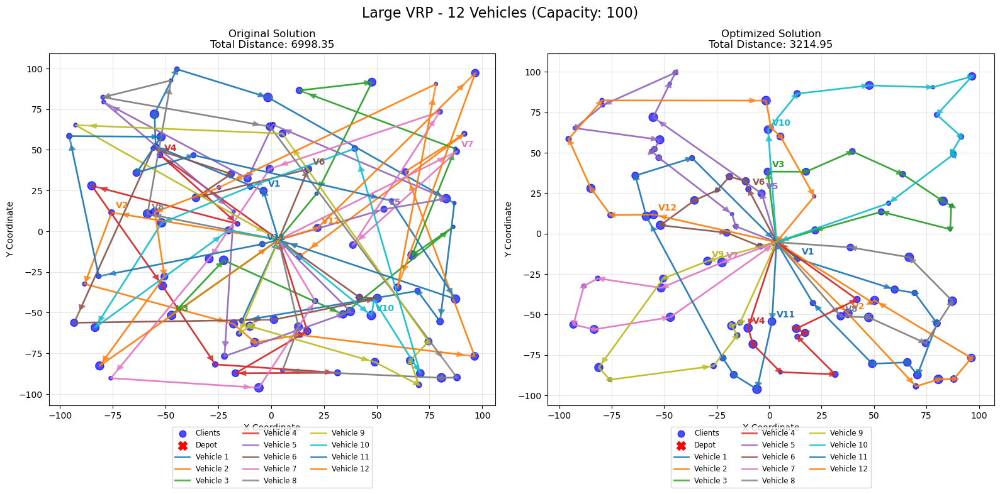


Solution improvement: 54.06%

--------------------------------------------------
CONFIGURATION: 14 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 14 vehicles of capacity 100...
Initial solution distance: 7787.51
Iteration 1: New best distance: 6470.32
Iteration 2: New best distance: 5262.06
Iteration 3: New best distance: 4956.69
Iteration 4: New best distance: 4567.65
Iteration 5: New best distance: 4434.74
Iteration 6: New best distance: 3979.00
Iteration 8: New best distance: 3875.61
Iteration 10: New best distance: 3707.95
Iteration 12: New best distance: 3684.02
Iteration 13: New best distance: 3622.85
Iteration 15: New best distance: 3561.41
Iteration 27: New best distance: 3539.11
Iteration 42: New best distance: 3515.22
Iteration 43: New best distance: 3407.52
Iteration 44: New best distance: 3367.75
Iteration 45: New best distance: 3271.84
Iteration 50: Current distance: 3271.84, Best: 3271.84, No improvement: 5
Iteration 55: N

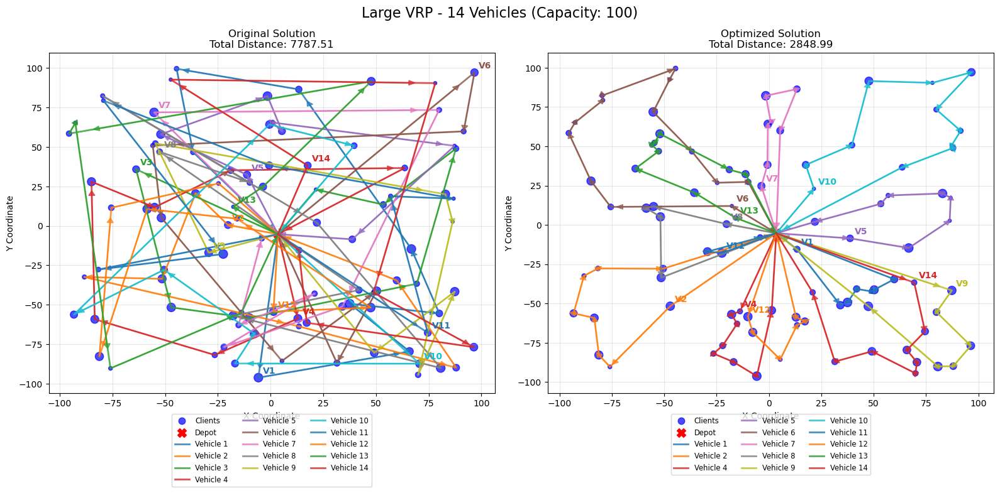


Solution improvement: 63.42%

--------------------------------------------------
CONFIGURATION: 16 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 16 vehicles of capacity 100...
Initial solution distance: 8456.74
Iteration 1: New best distance: 6407.41
Iteration 2: New best distance: 5729.39
Iteration 3: New best distance: 5124.14
Iteration 4: New best distance: 4550.67
Iteration 5: New best distance: 4180.73
Iteration 6: New best distance: 3937.84
Iteration 9: New best distance: 3881.20
Iteration 13: New best distance: 3845.95
Iteration 15: New best distance: 3822.32
Iteration 17: New best distance: 3721.54
Iteration 23: New best distance: 3612.20
Iteration 26: New best distance: 3598.23
Iteration 42: New best distance: 3453.22
Iteration 50: Current distance: 3453.22, Best: 3453.22, No improvement: 8
Iteration 51: New best distance: 3409.90
Iteration 76: New best distance: 3395.89
Iteration 81: New best distance: 3383.51
Iteration 100: 

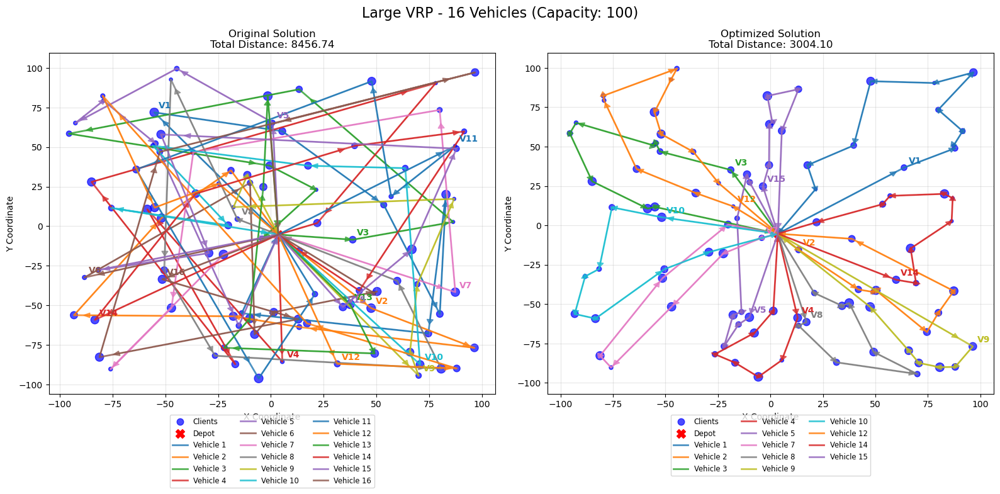


Solution improvement: 64.48%

--------------------------------------------------
CONFIGURATION: 18 vehicles with capacity 100
--------------------------------------------------
Starting LNS with 18 vehicles of capacity 100...
Initial solution distance: 8695.00
Iteration 1: New best distance: 6770.26
Iteration 2: New best distance: 5688.94
Iteration 3: New best distance: 5137.90
Iteration 4: New best distance: 4914.24
Iteration 5: New best distance: 4720.27
Iteration 6: New best distance: 4439.01
Iteration 7: New best distance: 4198.53
Iteration 9: New best distance: 4113.11
Iteration 11: New best distance: 3986.79
Iteration 14: New best distance: 3777.61
Iteration 15: New best distance: 3767.29
Iteration 16: New best distance: 3524.42
Iteration 18: New best distance: 3440.76
Iteration 19: New best distance: 3378.88
Iteration 21: New best distance: 3321.69
Iteration 23: New best distance: 3312.95
Iteration 36: New best distance: 3312.29
Iteration 41: New best distance: 3283.47
Iteratio

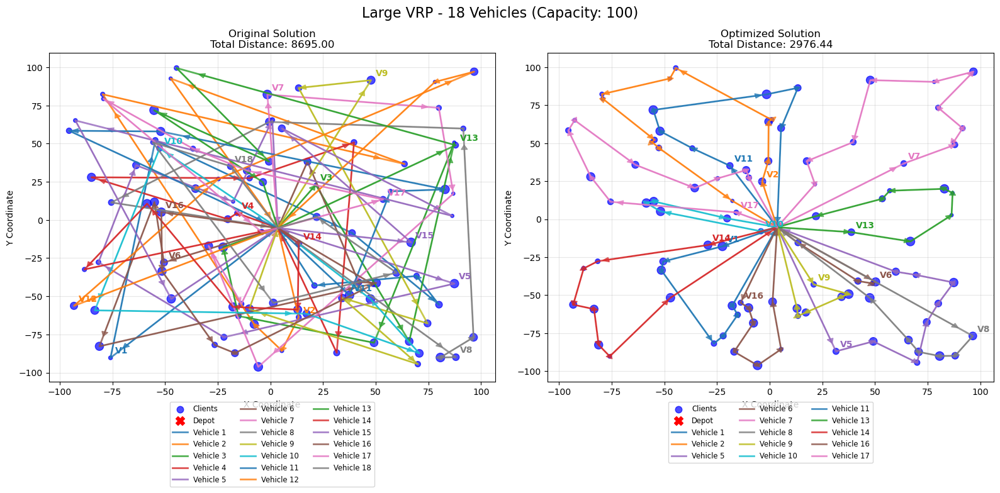


Solution improvement: 65.77%


COMPARISON OF ALL CONFIGURATIONS:
Vehicles   Initial Dist    Final Dist      Improvement     Valid     
----------------------------------------------------------------------
12         6998.35         3214.95         54.06          % ✓
14         7787.51         2848.99         63.42          % ✓
16         8456.74         3004.10         64.48          % ✓
18         8695.00         2976.44         65.77          % ✓

Best VALID configuration: 14 vehicles with distance 2848.99
   Improvement from initial solution: 63.42%


,Vehicle Count,Initial Distance,Final Distance,Improvement (%),Vehicles Used,Valid,Clients Visited
0,12,6998.348274,3214.945443,54.061368,12,True,99/99
1,14,7787.510528,2848.994037,63.415856,13,True,99/99
2,16,8456.741117,3004.095151,64.476917,12,True,99/99
3,18,8694.997697,2976.437005,65.768398,13,True,99/99


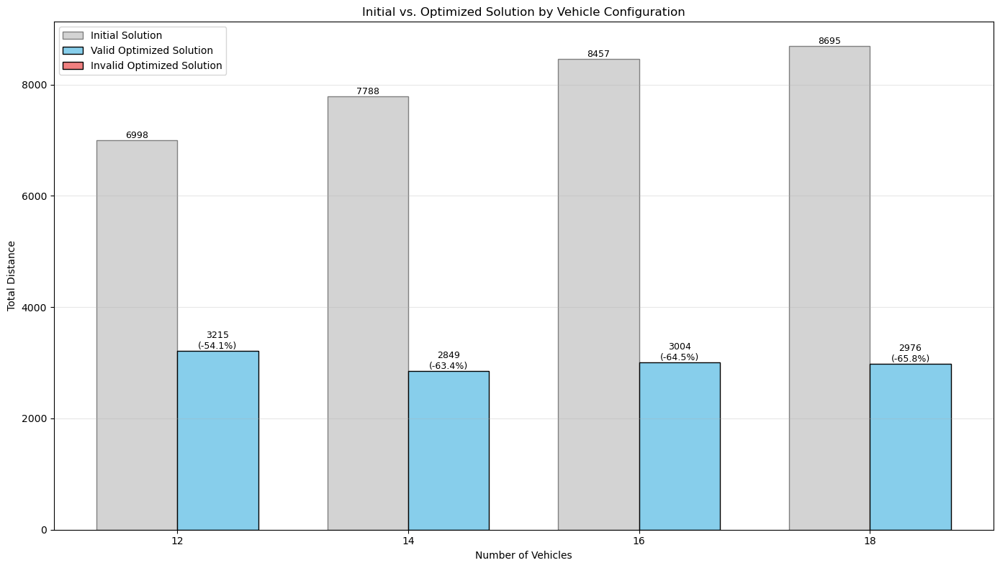

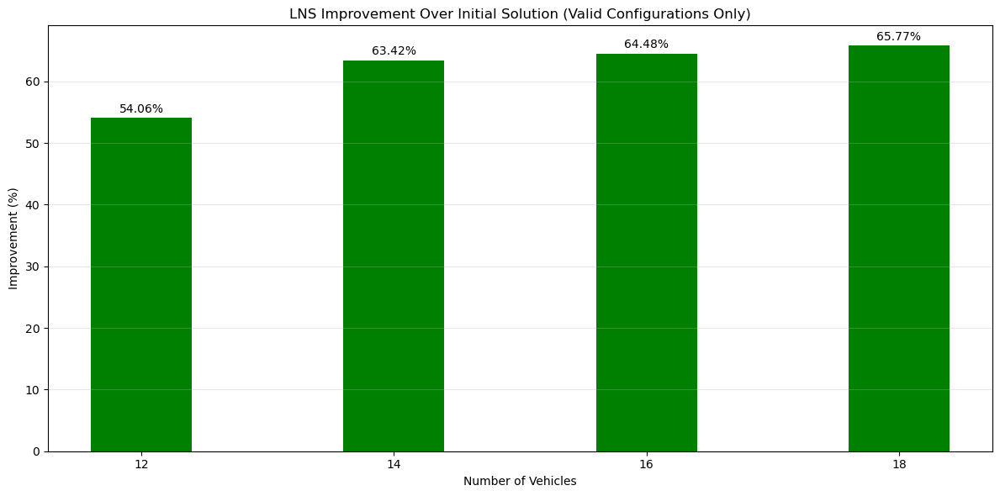



ANALYSIS OF VEHICLE EFFICIENCY:
Vehicles   Distance        Dist/Vehicle    Capacity Util  
------------------------------------------------------------
12         3214.95         267.91          97.3%
14         2848.99         219.15          83.4%
16         3004.10         250.34          73.0%
18         2976.44         228.96          64.9%


,Vehicle Count,Total Distance,Distance per Vehicle,Capacity Utilization (%)
0,12,3214.945443,267.912120,97.333333
1,14,2848.994037,219.153387,83.428571
2,16,3004.095151,250.341263,73.000000
3,18,2976.437005,228.956693,64.888889


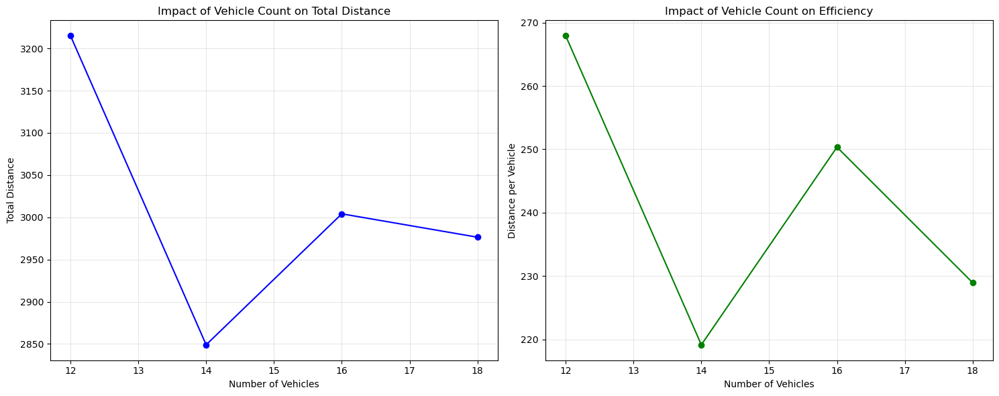


Configuration with minimum total distance: 14.0 vehicles
Configuration with minimum distance per vehicle: 14.0 vehicles


In [32]:
# Run the large VRP analysis with solution comparison
large_results, large_valid_results = solve_large_vrp_with_various_vehicle_counts()


Solving Large VRP with 12 Vehicles

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Starting LNS with 12 vehicles of capacity 100...
Initial solution distance: 6998.35
Iteration 1: New best distance: 5991.09
Iteration 2: New best distance: 5706.68
Iteration 3: New best distance: 5410.44
Iteration 4: New best distance: 5203.62
Iteration 5: New best distance: 4699.26
Iteration 8: New best distance: 4607.07
Iteration 9: New best distance: 4502.76
Iteration 12: New best distance: 4456.66

c:\Users\hseba\Anaconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(



Iteration 14: New best distance: 4454.55
Iteration 16: New best distance: 4327.43
Iteration 18: New best distance: 4265.66
Iteration 19: New best distance: 4140.02
Iteration 25: New best distance: 4094.79
Iteration 27: New best distance: 4016.51
Iteration 28: New best distance: 3958.18
Iteration 29: New best distance: 3945.57
Iteration 36: New best distance: 3904.84
Iteration 38: New best distance: 3887.12
Iteration 41: New best distance: 3811.82
Iteration 45: New best distance: 3794.55
Iteration 50: Current distance: 3794.55, Best: 3794.55, No improvement: 5
Iteration 54: New best distance: 3736.20
Iteration 60: New best distance: 3656.06
Iteration 69: New best distance: 3610.15
Iteration 75: New best distance: 3581.79
Iteration 91: New best distance: 3561.74
Iteration 100: Current distance: 3561.74, Best: 3561.74, No improvement: 9
Iteration 109: New best distance: 3557.96
Iteration 110: New best distance: 3547.90
Iteration 116: New best distance: 3448.77
Iteration 134: New best dis

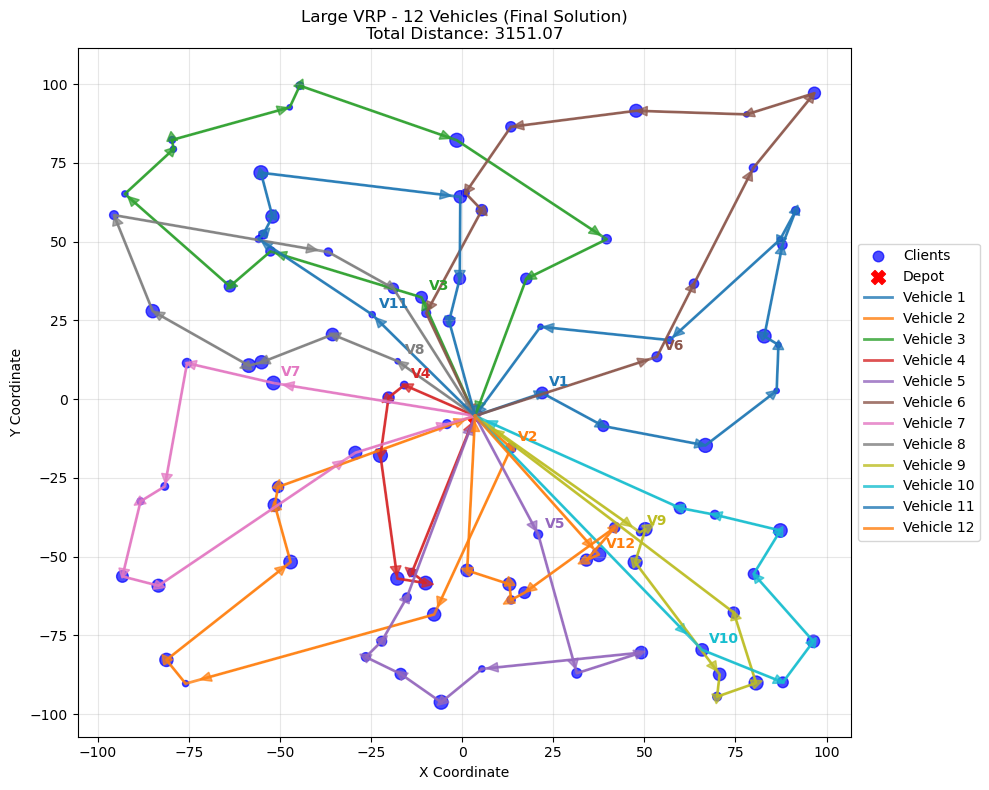


Solving Large VRP with 14 Vehicles

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Starting LNS with 14 vehicles of capacity 100...
Initial solution distance: 7787.51
Iteration 1: New best distance: 6035.13
Iteration 2: New best distance: 5536.18
Iteration 3: New best distance: 5061.13
Iteration 4: New best distance: 4722.07
Iteration 5: New best distance: 4503.78
Iteration 6: New best distance: 4407.03
Iteration 9: New best distance: 4358.44


c:\Users\hseba\Anaconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Iteration 15: New best distance: 4357.49
Iteration 17: New best distance: 4294.72
Iteration 18: New best distance: 4215.01
Iteration 21: New best distance: 4214.98
Iteration 22: New best distance: 4170.89
Iteration 26: New best distance: 3910.33
Iteration 37: New best distance: 3739.74
Iteration 41: New best distance: 3592.53
Iteration 43: New best distance: 3542.11
Iteration 50: Current distance: 3542.11, Best: 3542.11, No improvement: 7
Iteration 52: New best distance: 3533.95
Iteration 66: New best distance: 3522.64
Iteration 69: New best distance: 3451.86
Iteration 85: New best distance: 3413.71
Iteration 99: New best distance: 3380.17
Iteration 100: Current distance: 3380.17, Best: 3380.17, No improvement: 1
Iteration 103: New best distance: 3334.11
Iteration 128: New best distance: 3330.54
Iteration 134: New best distance: 3326.01
Iteration 150: Current distance: 3326.01, Best: 3326.01, No improvement: 16
Iteration 174: New best distance: 3255.69
Iteration 200: New best distance:

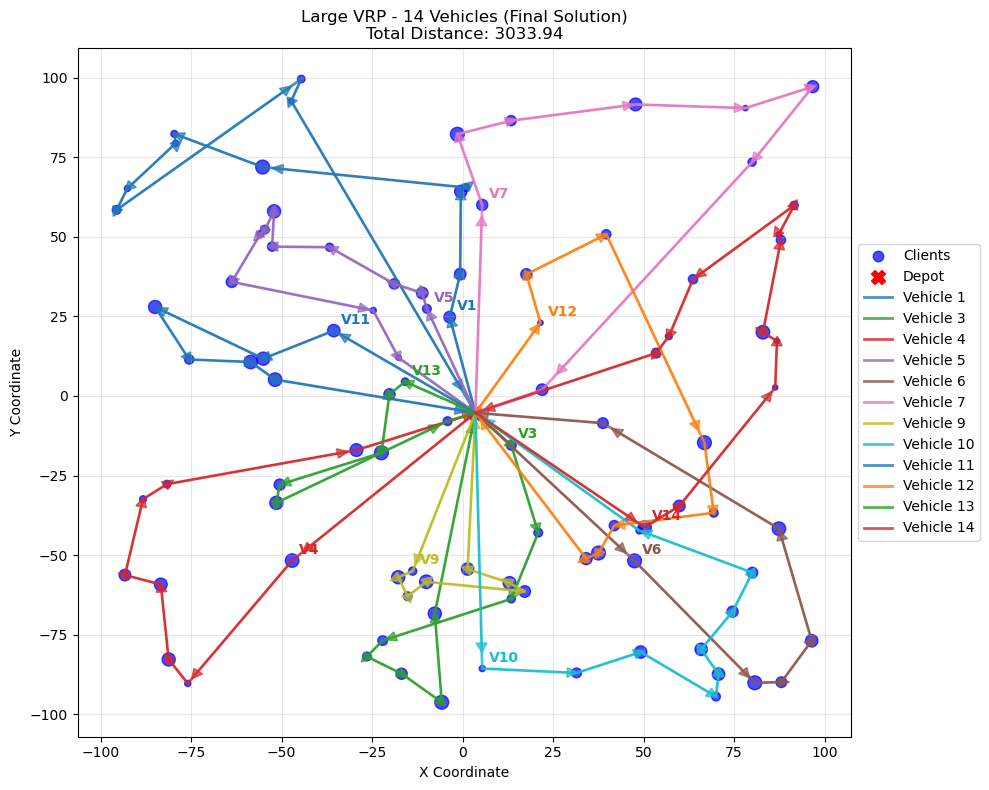

In [33]:
from sklearn.cluster import KMeans

def cluster_based_initialization(depot, clients, vehicles):
    """
    Initialize routes using K-Means clustering.
    Each cluster corresponds to a vehicle route.
    """
    num_vehicles = len(vehicles)
    client_coords = np.array([[client["X"], client["Y"]] for client in clients])
    
    # Perform K-Means clustering
    kmeans = KMeans(n_clusters=num_vehicles, random_state=42)
    cluster_labels = kmeans.fit_predict(client_coords)
    
    # Initialize routes based on clusters
    routes = {vehicle["Vehicle_ID"]: [0] for vehicle in vehicles}  # Start with depot
    for client, label in zip(clients, cluster_labels):
        vehicle_id = vehicles[label]["Vehicle_ID"]
        routes[vehicle_id].append(client["ID"])
    
    # Add return to depot for all routes
    for vehicle_id in routes:
        routes[vehicle_id].append(0)
    
    return routes

def cross_exchange(routes, client_map, max_iterations=50, vehicle_capacities=None):
    """
    Perform cross-exchange optimization between routes.
    Tries to swap segments between two routes to reduce total distance,
    while respecting vehicle capacity constraints.
    """
    vehicle_ids = list(routes.keys())
    improved = True
    iteration = 0
    
    while improved and iteration < max_iterations:
        improved = False
        iteration += 1
        print(f"Iteration {iteration}: Starting cross-exchange...")
        
        for i in range(len(vehicle_ids)):
            for j in range(i + 1, len(vehicle_ids)):
                route1_id = vehicle_ids[i]
                route2_id = vehicle_ids[j]
                route1 = routes[route1_id]
                route2 = routes[route2_id]
                
                # Try swapping segments between route1 and route2
                for start1 in range(1, len(route1) - 1):
                    for end1 in range(start1, len(route1) - 1):
                        for start2 in range(1, len(route2) - 1):
                            for end2 in range(start2, len(route2) - 1):
                                # Create new routes with swapped segments
                                new_route1 = route1[:start1] + route2[start2:end2 + 1] + route1[end1 + 1:]
                                new_route2 = route2[:start2] + route1[start1:end1 + 1] + route2[end2 + 1:]
                                
                                # Calculate total demand for the new routes
                                new_route1_demand = sum(client_map[node_id]["Demand"] for node_id in new_route1 if node_id != 0)
                                new_route2_demand = sum(client_map[node_id]["Demand"] for node_id in new_route2 if node_id != 0)
                                
                                # Check if the new routes respect capacity constraints
                                if (vehicle_capacities and
                                    (new_route1_demand > vehicle_capacities[route1_id] or
                                     new_route2_demand > vehicle_capacities[route2_id])):
                                    continue  # Skip this swap if it violates capacity constraints
                                
                                # Calculate distances
                                original_distance = calculate_route_distance(route1, client_map) + calculate_route_distance(route2, client_map)
                                new_distance = calculate_route_distance(new_route1, client_map) + calculate_route_distance(new_route2, client_map)
                                
                                # If the new routes are better, accept the swap
                                if new_distance < original_distance:
                                    distance_saved = original_distance - new_distance
                                    routes[route1_id] = new_route1
                                    routes[route2_id] = new_route2
                                    improved = True
                                    print(f"Improved solution found in iteration {iteration}: New distance = {new_distance:.2f}, Distance saved = {distance_saved:.2f}")
                                    break
                            if improved:
                                break
                        if improved:
                            break
                    if improved:
                        break
                if improved:
                    break
    
    print(f"Cross-exchange completed after {iteration} iterations.")
    return routes

# Solve the large VRP for 12 and 14 vehicles
for vehicle_count in [12, 14]:
    print(f"\n{'='*50}")
    print(f"Solving Large VRP with {vehicle_count} Vehicles")
    print(f"{'='*50}\n")
    
    # Read data
    depot, clients, _ = read_vrp_data(PROBLEM_SIZE)
    vehicles = [{"Vehicle_ID": i, "Capacity": 100} for i in range(1, vehicle_count + 1)]
    
    # Step 1: Cluster-based initialization
    initial_routes = cluster_based_initialization(depot, clients, vehicles)
    client_map = {client["ID"]: client for client in clients}
    client_map[0] = depot  # Add depot to client map
    
    # Step 2: Refine with LNS
    lns_routes, lns_distance, _, _ = large_neighborhood_search(depot, clients, vehicles)
    
    # Step 3: Further optimize with cross-exchange
    vehicle_capacities = {vehicle["Vehicle_ID"]: vehicle["Capacity"] for vehicle in vehicles}
    optimized_routes = cross_exchange(lns_routes, client_map, vehicle_capacities=vehicle_capacities)
    optimized_distance = calculate_total_distance(optimized_routes, client_map)
    
    # Report results
    print(f"Initial Distance (Cluster-Based): {calculate_total_distance(initial_routes, client_map):.2f}")
    print(f"Distance After LNS: {lns_distance:.2f}")
    print(f"Distance After Cross-Exchange: {optimized_distance:.2f}")
    
    # Print final routes and capacities
    print("\nFinal Routes and Capacities After Cross-Exchange Optimization:")
    for vehicle_id, route in optimized_routes.items():
        route_demand = sum(client_map[node_id]["Demand"] for node_id in route if node_id != 0)
        print(f"Vehicle {vehicle_id}: Route = {route}, Demand = {route_demand}/{vehicle_capacities[vehicle_id]}")
    
    # Plot the final solution
    plot_vrp_solution(depot, clients, optimized_routes, title=f"Large VRP - {vehicle_count} Vehicles (Final Solution)")


Solving Large VRP with 12 Vehicles

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Starting LNS with 12 vehicles of capacity 100...
Initial solution distance: 6998.35
Iteration 1: New best distance: 5985.73
Iteration 2: New best distance: 5532.01
Iteration 3: New best distance: 4928.89
Iteration 5: New best distance: 4776.86
Iteration 9: New best distance: 4593.10
Iteration 10: New best distance: 4467.99
Iteration 12: New best distance: 4429.31


c:\Users\hseba\Anaconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Iteration 13: New best distance: 4366.30
Iteration 14: New best distance: 4101.29
Iteration 15: New best distance: 4082.56
Iteration 17: New best distance: 4033.38
Iteration 20: New best distance: 3942.13
Iteration 23: New best distance: 3929.04
Iteration 24: New best distance: 3868.52
Iteration 28: New best distance: 3647.02
Iteration 34: New best distance: 3617.79
Iteration 50: Current distance: 3617.79, Best: 3617.79, No improvement: 16
Iteration 65: New best distance: 3578.53
Iteration 67: New best distance: 3521.94
Iteration 92: New best distance: 3492.50
Iteration 100: Current distance: 3492.50, Best: 3492.50, No improvement: 8
Iteration 122: New best distance: 3471.55
Iteration 125: New best distance: 3469.50
Iteration 129: New best distance: 3332.45
Iteration 138: New best distance: 3321.81
Iteration 144: New best distance: 3220.84
Iteration 150: Current distance: 3220.84, Best: 3220.84, No improvement: 6
Iteration 200: Current distance: 3220.84, Best: 3220.84, No improvement: 

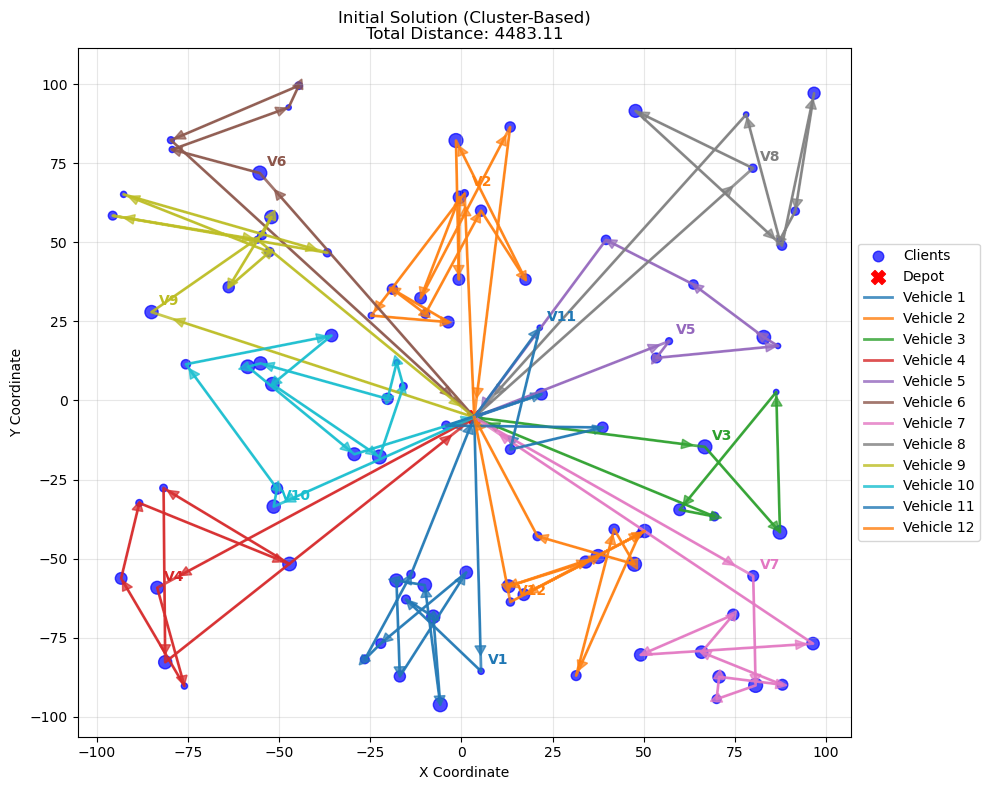

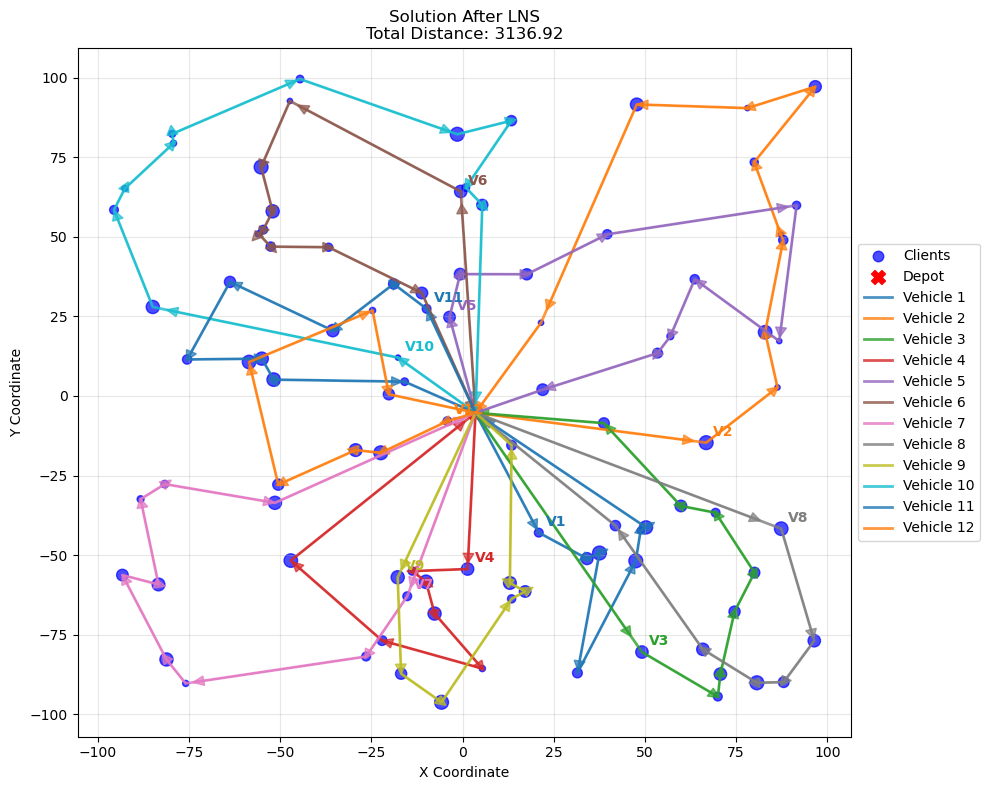

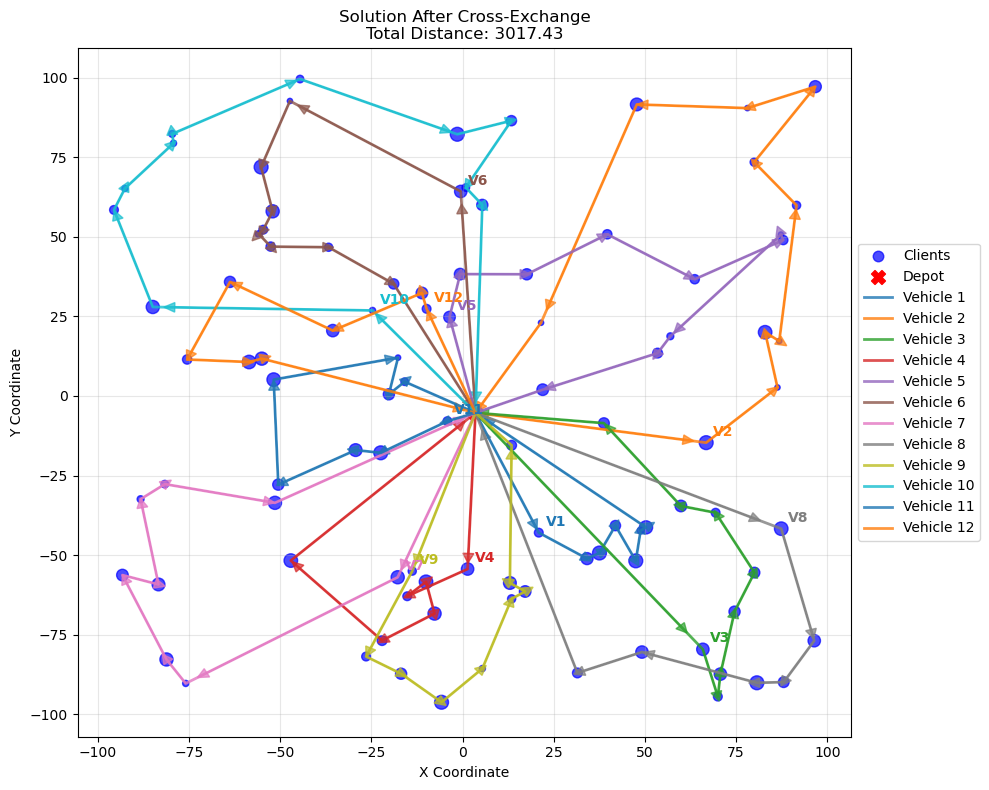

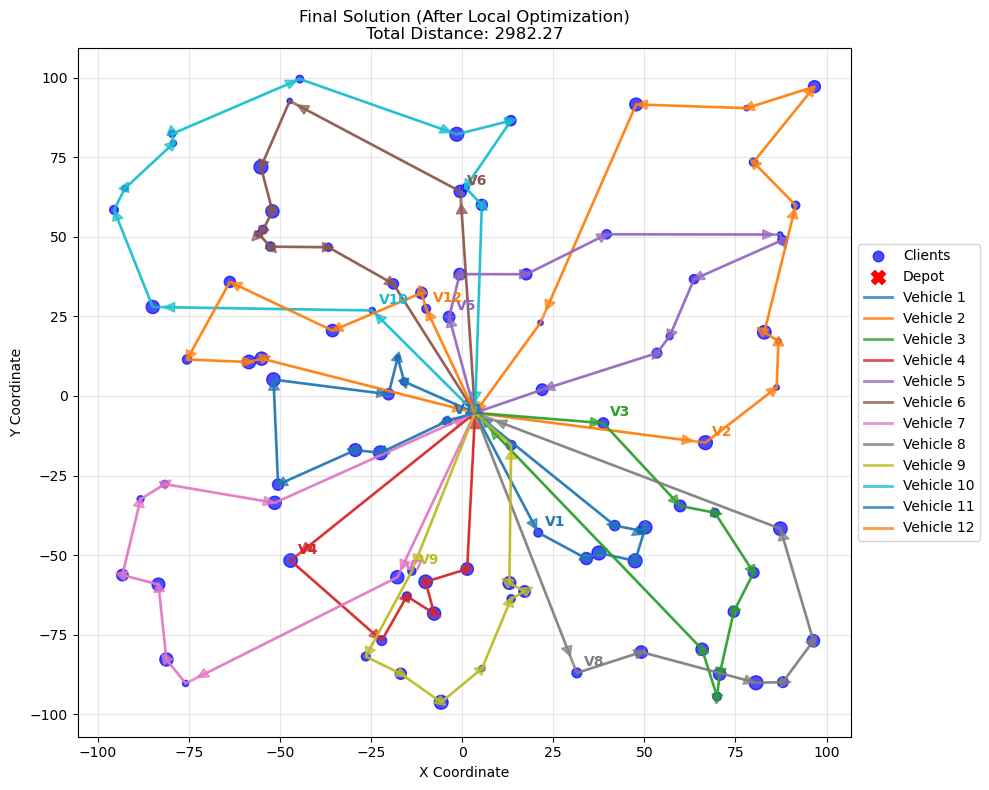


Solving Large VRP with 13 Vehicles

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Starting LNS with 13 vehicles of capacity 100...
Initial solution distance: 7585.36
Iteration 1: New best distance: 6351.77
Iteration 2: New best distance: 5613.42
Iteration 3: New best distance: 5252.83
Iteration 4: New best distance: 5222.69
Iteration 5: New best distance: 5114.23
Iteration 8: New best distance: 5031.03
Iteration 9: New best distance: 4866.43
Iteration 10: New best distance: 4791.25
Iteration 11: New best distance: 4379.51


c:\Users\hseba\Anaconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Iteration 12: New best distance: 4140.46
Iteration 14: New best distance: 3883.31
Iteration 16: New best distance: 3843.64
Iteration 18: New best distance: 3811.14
Iteration 19: New best distance: 3732.53
Iteration 20: New best distance: 3667.58
Iteration 23: New best distance: 3624.77
Iteration 24: New best distance: 3548.72
Iteration 25: New best distance: 3401.63
Iteration 26: New best distance: 3326.78
Iteration 32: New best distance: 3303.34
Iteration 37: New best distance: 3275.42
Iteration 44: New best distance: 3250.24
Iteration 50: Current distance: 3250.24, Best: 3250.24, No improvement: 6
Iteration 62: New best distance: 3209.54
Iteration 68: New best distance: 3164.94
Iteration 72: New best distance: 3161.65
Iteration 89: New best distance: 3134.04
Iteration 95: New best distance: 3115.49
Iteration 97: New best distance: 3085.52
Iteration 100: Current distance: 3085.52, Best: 3085.52, No improvement: 3
Iteration 105: New best distance: 3063.44
Iteration 116: New best distan

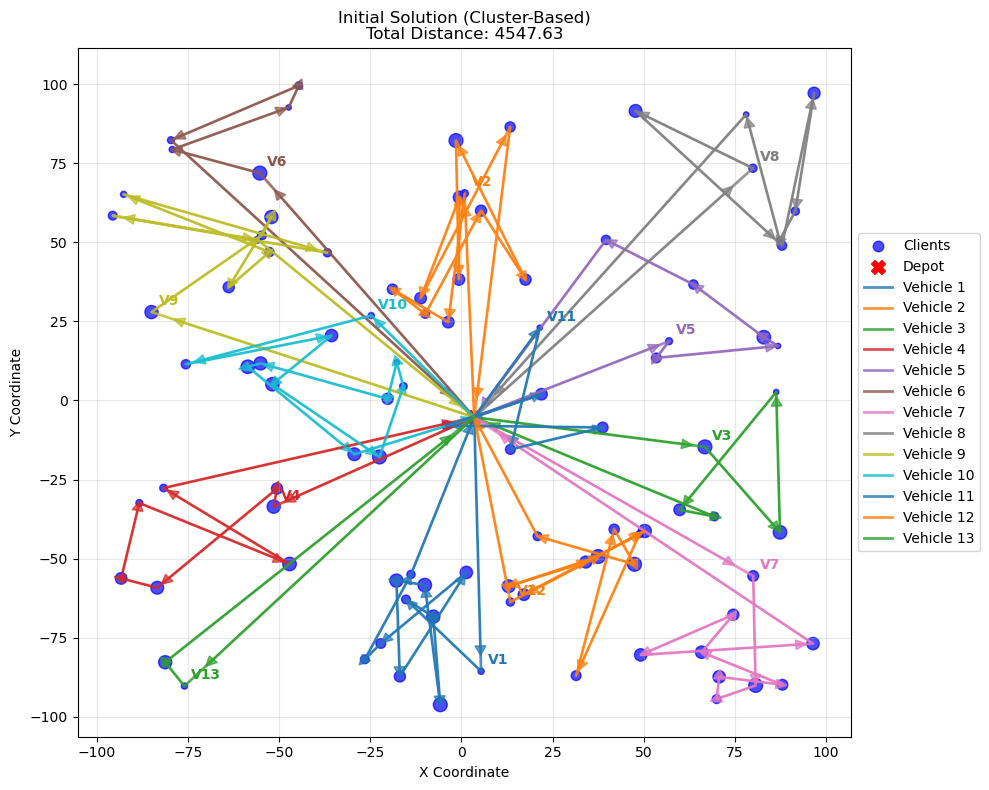

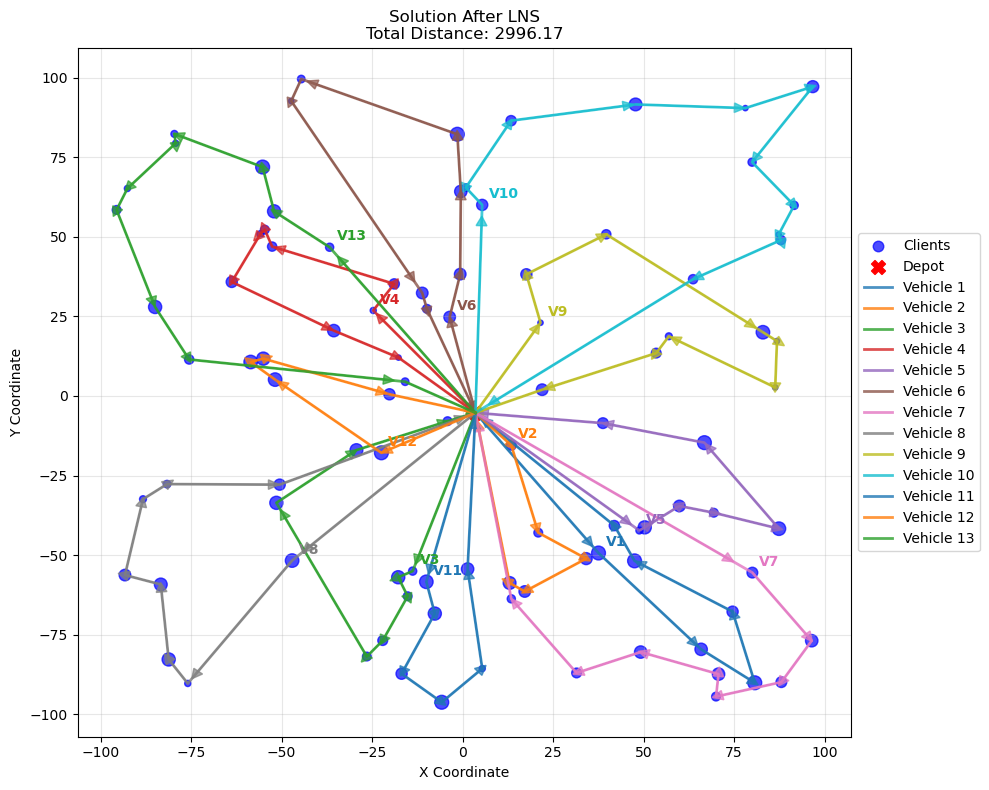

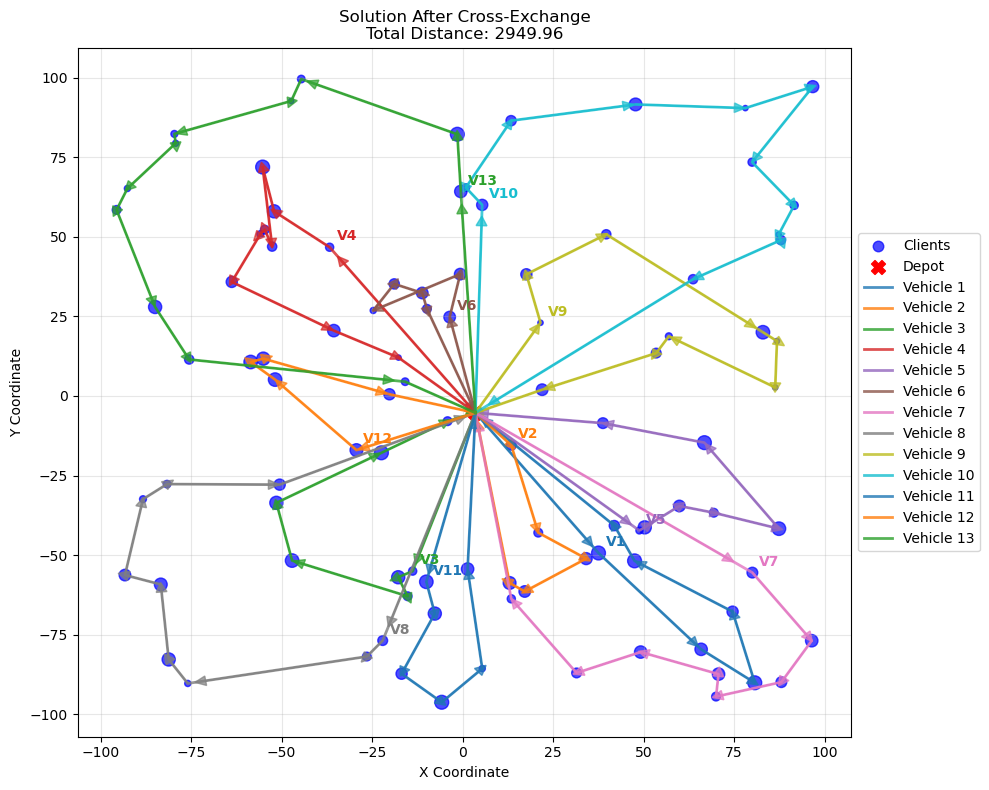

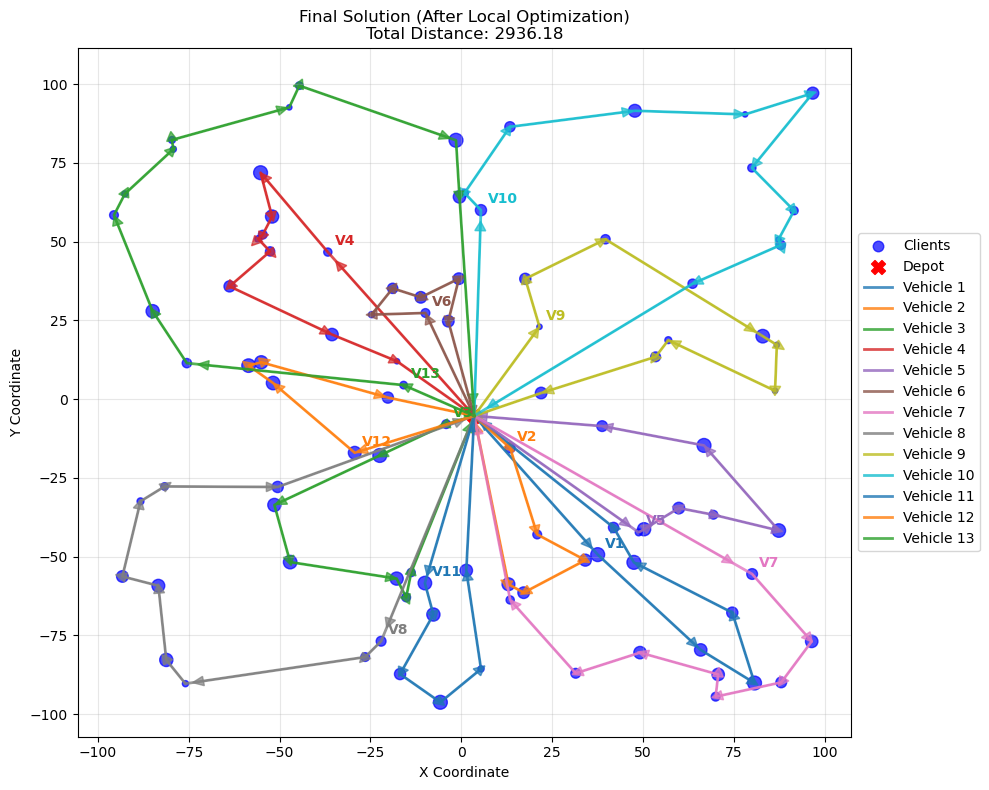


Solving Large VRP with 14 Vehicles

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Starting LNS with 14 vehicles of capacity 100...
Initial solution distance: 7787.51
Iteration 1: New best distance: 6109.32
Iteration 2: New best distance: 5310.88
Iteration 3: New best distance: 4805.03
Iteration 4: New best distance: 4393.28
Iteration 5: New best distance: 4372.38
Iteration 6: New best distance: 4190.73
Iteration 7: New best distance: 4061.98
Iteration 8: New best distance: 3975.83


c:\Users\hseba\Anaconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Iteration 9: New best distance: 3893.70
Iteration 11: New best distance: 3744.68
Iteration 13: New best distance: 3660.31
Iteration 19: New best distance: 3618.81
Iteration 22: New best distance: 3562.62
Iteration 30: New best distance: 3546.62
Iteration 41: New best distance: 3482.75
Iteration 50: Current distance: 3482.75, Best: 3482.75, No improvement: 9
Iteration 54: New best distance: 3439.30
Iteration 57: New best distance: 3405.78
Iteration 59: New best distance: 3400.07
Iteration 63: New best distance: 3393.51
Iteration 68: New best distance: 3313.42
Iteration 70: New best distance: 3265.48
Iteration 100: Current distance: 3265.48, Best: 3265.48, No improvement: 30
Iteration 105: New best distance: 3194.18
Iteration 107: New best distance: 3183.25
Iteration 150: Current distance: 3183.25, Best: 3183.25, No improvement: 43
Iteration 200: Current distance: 3183.25, Best: 3183.25, No improvement: 93
Iteration 204: New best distance: 3177.26
Iteration 250: Current distance: 3177.26

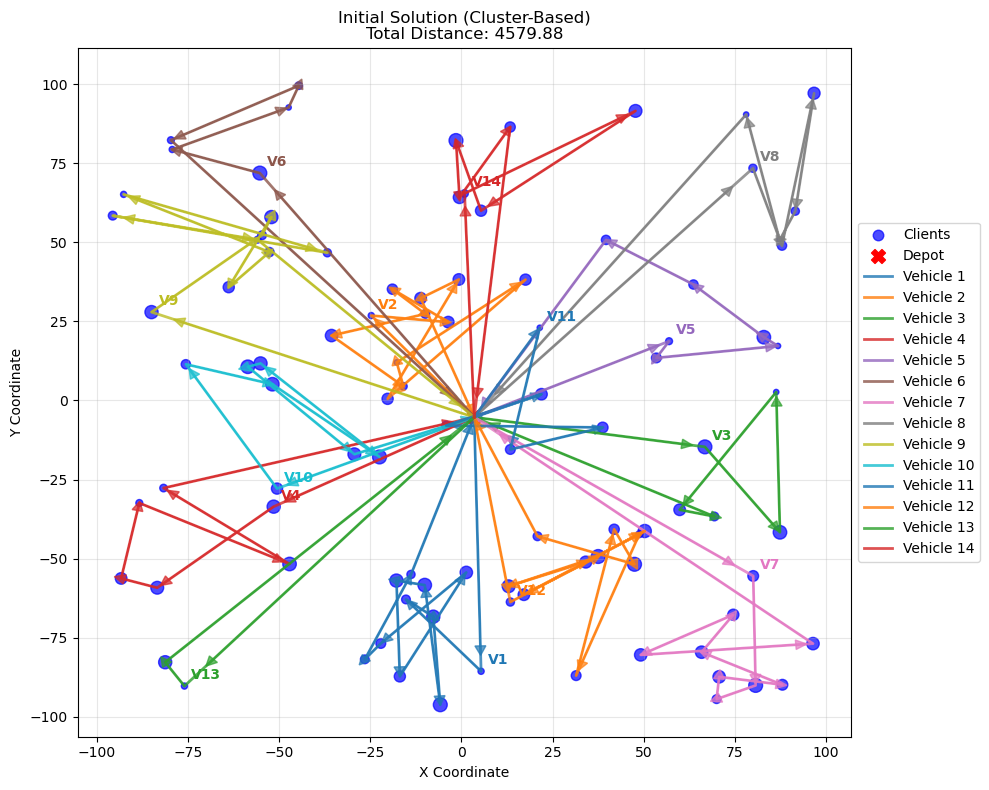

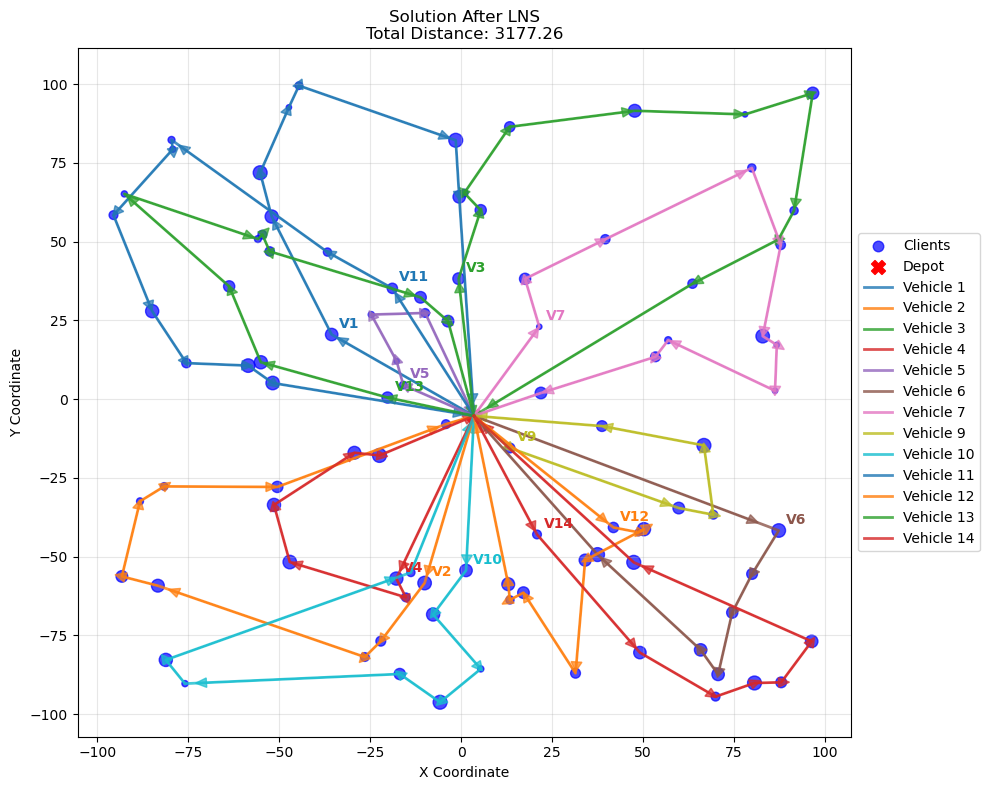

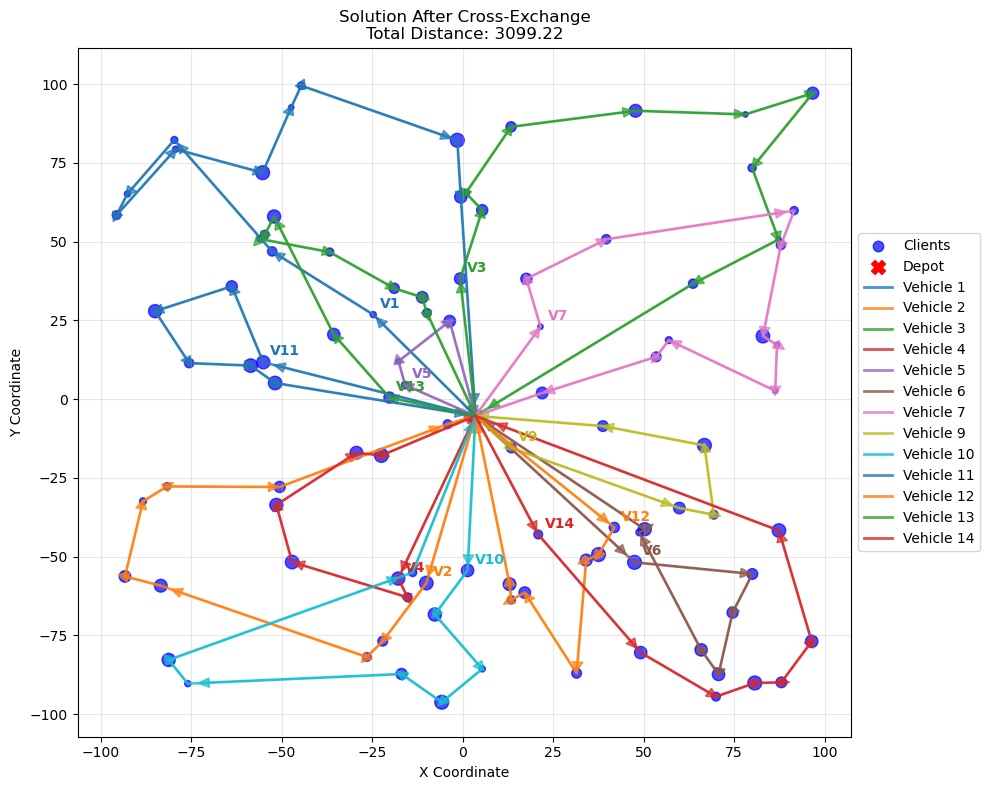

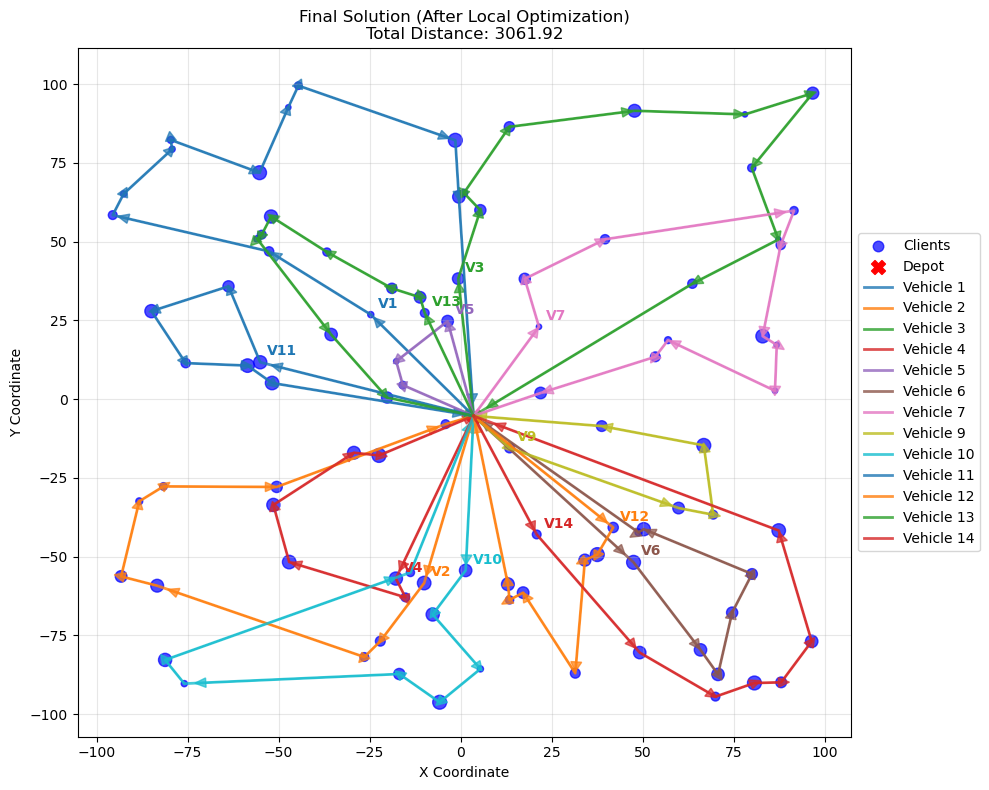


Solving Large VRP with 15 Vehicles

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Starting LNS with 15 vehicles of capacity 100...
Initial solution distance: 8365.45
Iteration 1: New best distance: 6803.76
Iteration 2: New best distance: 5878.85
Iteration 3: New best distance: 5298.08
Iteration 4: New best distance: 4927.25
Iteration 5: New best distance: 4724.55
Iteration 6: New best distance: 4385.62
Iteration 7: New best distance: 4303.05
Iteration 10: New best distance: 4075.62


c:\Users\hseba\Anaconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Iteration 11: New best distance: 3898.23
Iteration 13: New best distance: 3890.37
Iteration 14: New best distance: 3745.89
Iteration 16: New best distance: 3716.90
Iteration 20: New best distance: 3502.08
Iteration 31: New best distance: 3410.34
Iteration 50: Current distance: 3410.34, Best: 3410.34, No improvement: 19
Iteration 100: Current distance: 3410.34, Best: 3410.34, No improvement: 69
LNS completed in 2.43 seconds
Initial distance: 8365.45
Final best distance: 3410.34
Improvement: 59.23%
Vehicles used: 13 out of 15
Iteration 1: Starting cross-exchange...
Improved solution found in iteration 1: New distance = 540.47, Distance saved = 3.44
Iteration 2: Starting cross-exchange...
Improved solution found in iteration 2: New distance = 524.86, Distance saved = 15.60
Iteration 3: Starting cross-exchange...
Improved solution found in iteration 3: New distance = 543.87, Distance saved = 2.16
Iteration 4: Starting cross-exchange...
Improved solution found in iteration 4: New distance =

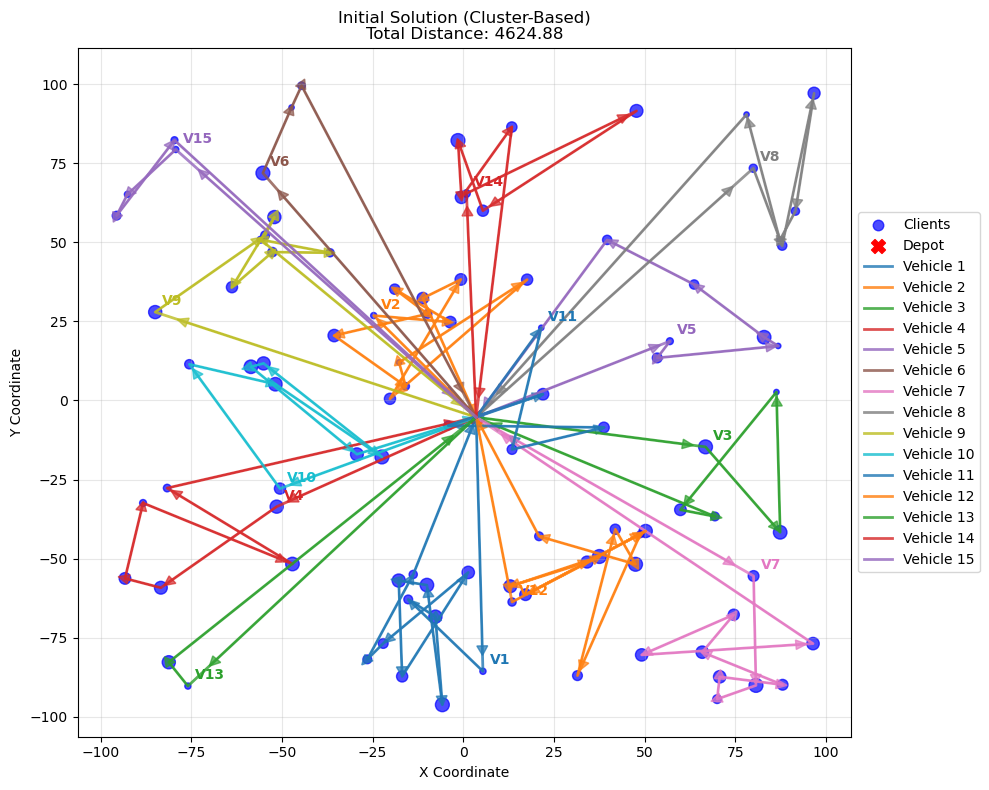

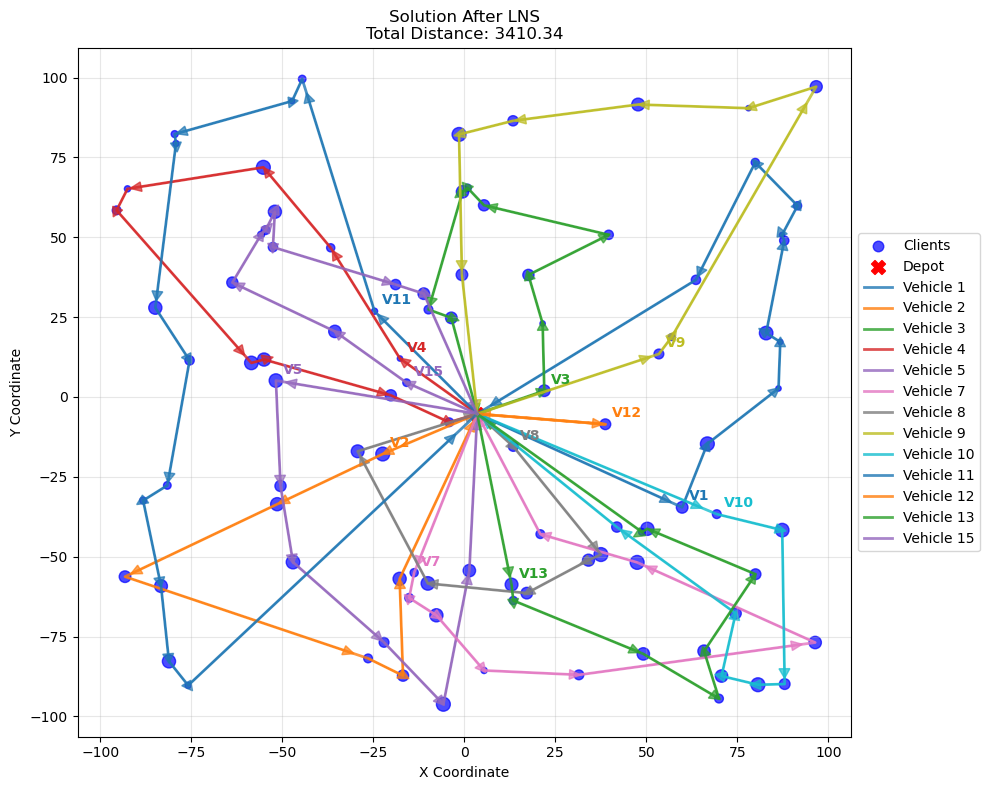

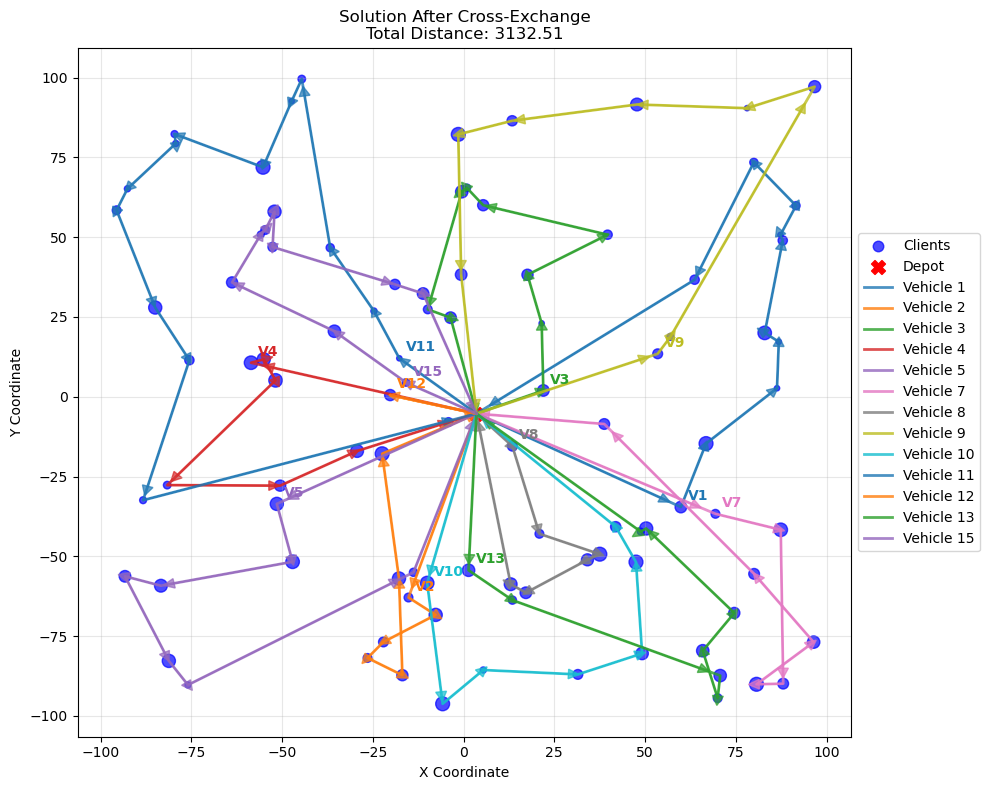

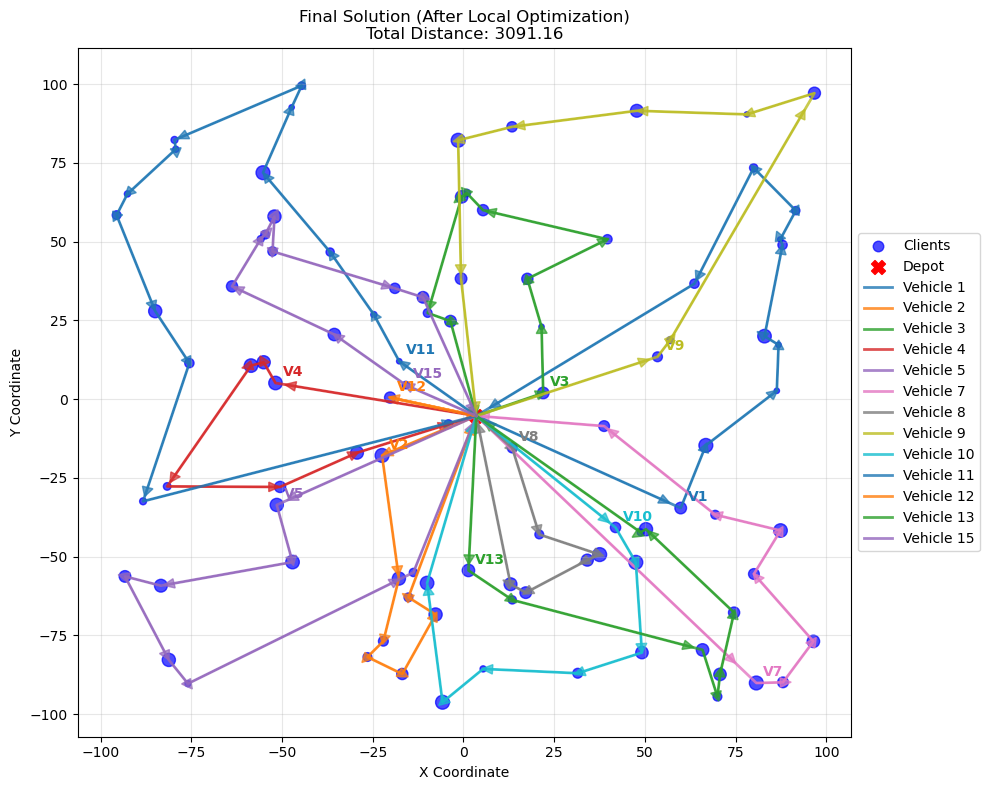


Solving Large VRP with 16 Vehicles

Reading data for large-vrp...
Looking for client data at: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\data\large-vrp\vrp.csv
Read 99 clients and 1 depot.
No vehicles file found for None vehicles. Vehicles will need to be generated dynamically.
Starting LNS with 16 vehicles of capacity 100...
Initial solution distance: 8456.74
Iteration 1: New best distance: 6370.93
Iteration 2: New best distance: 5737.67
Iteration 3: New best distance: 5091.85
Iteration 4: New best distance: 4848.12
Iteration 5: New best distance: 4424.13
Iteration 6: New best distance: 4287.68


c:\Users\hseba\Anaconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Iteration 7: New best distance: 4132.90
Iteration 9: New best distance: 4071.46
Iteration 11: New best distance: 4029.25
Iteration 12: New best distance: 3964.60
Iteration 13: New best distance: 3893.10
Iteration 14: New best distance: 3823.50
Iteration 15: New best distance: 3808.16
Iteration 17: New best distance: 3760.02
Iteration 19: New best distance: 3565.58
Iteration 21: New best distance: 3499.65
Iteration 23: New best distance: 3460.93
Iteration 26: New best distance: 3407.82
Iteration 34: New best distance: 3317.60
Iteration 37: New best distance: 3271.23
Iteration 41: New best distance: 3264.67
Iteration 46: New best distance: 3213.50
Iteration 50: Current distance: 3213.50, Best: 3213.50, No improvement: 4
Iteration 53: New best distance: 3147.64
Iteration 69: New best distance: 3147.00
Iteration 77: New best distance: 3141.16
Iteration 92: New best distance: 3114.56
Iteration 94: New best distance: 3097.07
Iteration 100: Current distance: 3097.07, Best: 3097.07, No improve

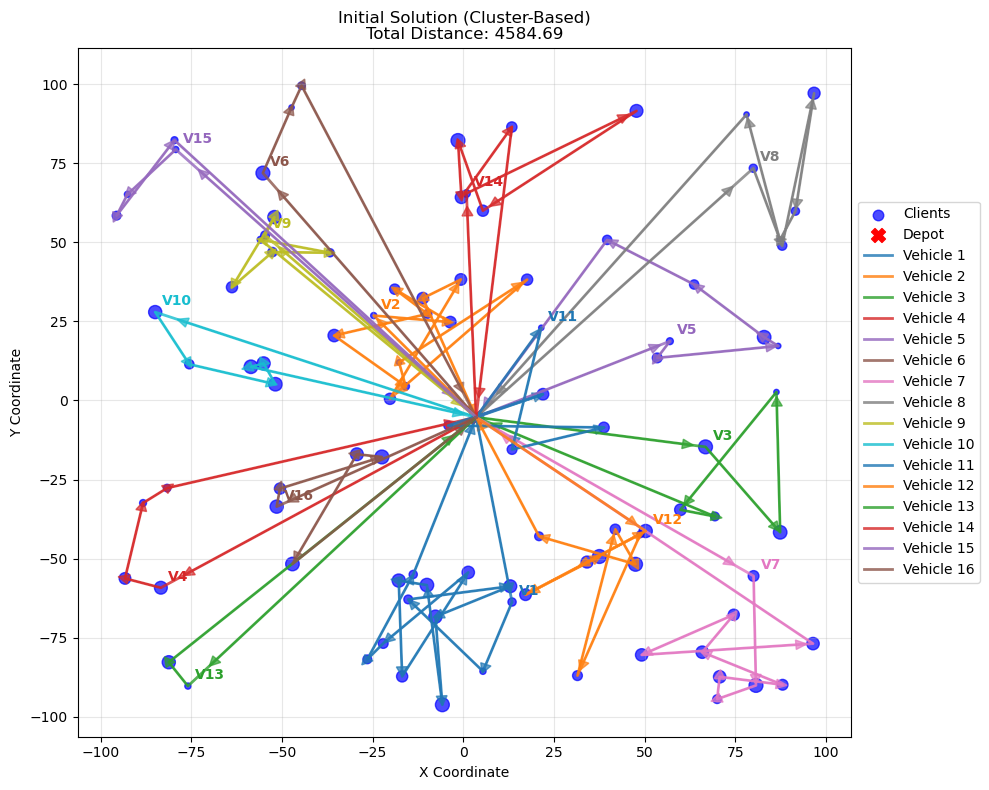

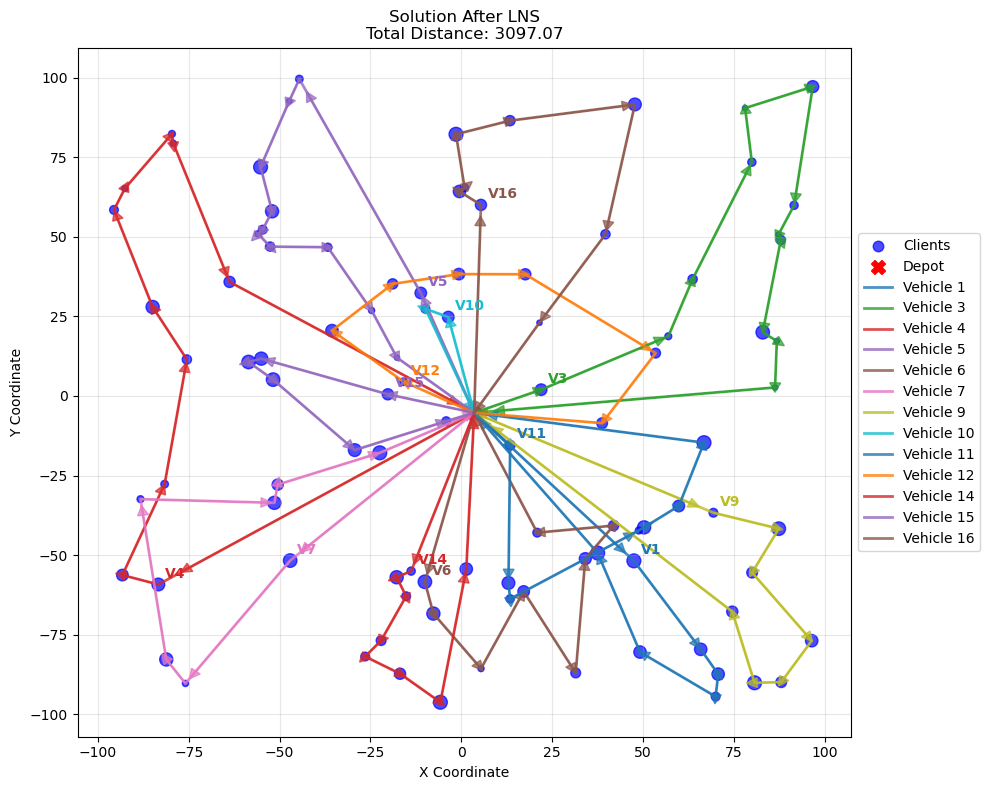

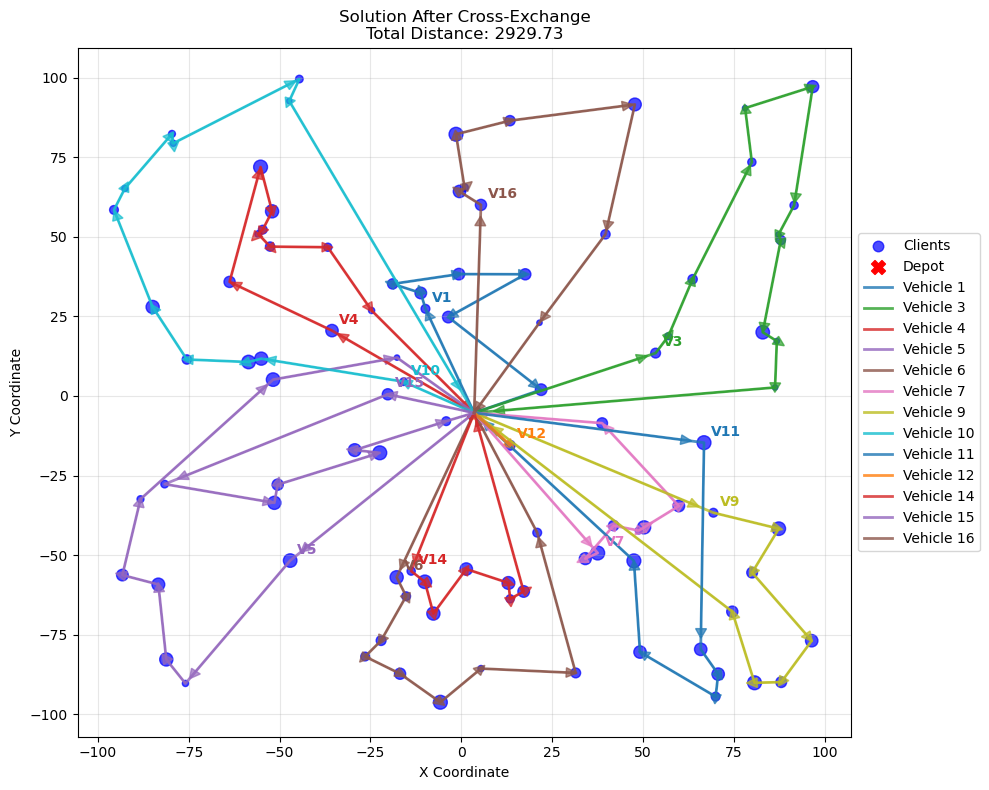

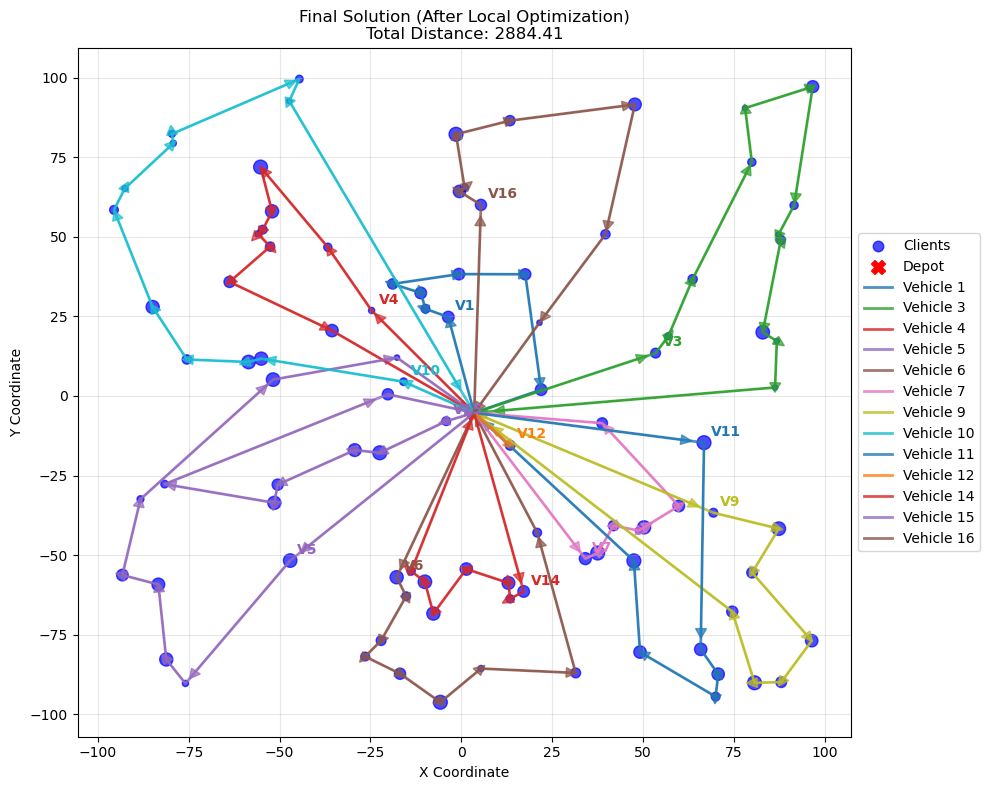

In [34]:
# Optimize further with 2opt

def detect_and_correct_backtracking(route, client_map):
    """
    Detect and correct backtracking in a route by swapping clients.
    """
    print("Detecting and correcting backtracking...")
    improved = False
    for i in range(1, len(route) - 2):  # Skip depot at start and end
        for j in range(i + 1, len(route) - 1):
            # Create a new route with swapped clients
            new_route = route[:i] + [route[j]] + route[i + 1:j] + [route[i]] + route[j + 1:]
            
            # Calculate distances
            original_distance = calculate_route_distance(route, client_map)
            new_distance = calculate_route_distance(new_route, client_map)
            
            # If the new route is better, apply the swap
            if new_distance < original_distance:
                route = new_route
                improved = True
                print(f"Backtracking corrected: New distance = {new_distance:.2f}, Improvement = {original_distance - new_distance:.2f}")
                break
        if improved:
            break
    return route

# Solve the large VRP for 12 and 14 vehicles
for vehicle_count in [12, 13, 14, 15, 16]:
    print(f"\n{'='*50}")
    print(f"Solving Large VRP with {vehicle_count} Vehicles")
    print(f"{'='*50}\n")
    
    # Read data
    depot, clients, _ = read_vrp_data(PROBLEM_SIZE)
    vehicles = [{"Vehicle_ID": i, "Capacity": 100} for i in range(1, vehicle_count + 1)]
    
    # Step 1: Cluster-based initialization
    initial_routes = cluster_based_initialization(depot, clients, vehicles)
    client_map = {client["ID"]: client for client in clients}
    client_map[0] = depot  # Add depot to client map
    initial_distance = calculate_total_distance(initial_routes, client_map)
    
    # Step 2: Refine with LNS
    lns_routes, lns_distance, _, _ = large_neighborhood_search(depot, clients, vehicles)

    # Make a deep copy of lns_routes to preserve the original LNS solution
    lns_routes_copy = copy.deepcopy(lns_routes)

    # Step 3: Further optimize with cross-exchange
    vehicle_capacities = {vehicle["Vehicle_ID"]: vehicle["Capacity"] for vehicle in vehicles}
    cross_exchange_routes = cross_exchange(lns_routes_copy, client_map, vehicle_capacities=vehicle_capacities)
    cross_exchange_distance = calculate_total_distance(cross_exchange_routes, client_map)

    # Step 4: Apply local optimization (2-opt and backtracking correction)
    optimized_routes = copy.deepcopy(cross_exchange_routes)
    for vehicle_id, route in optimized_routes.items():
        optimized_routes[vehicle_id], _ = apply_2opt(route, client_map)
    for vehicle_id, route in optimized_routes.items():
        optimized_routes[vehicle_id] = detect_and_correct_backtracking(route, client_map)
    optimized_distance = calculate_total_distance(optimized_routes, client_map)

    # Report results
    print(f"Initial Distance (Cluster-Based): {initial_distance:.2f}")
    print(f"Distance After LNS: {lns_distance:.2f}")
    print(f"Distance After Cross-Exchange: {cross_exchange_distance:.2f}")
    print(f"Distance After Local Optimization: {optimized_distance:.2f}")

    # Plot all four solutions for comparison
    plot_vrp_solution(depot, clients, initial_routes, title=f"Initial Solution (Cluster-Based)")
    plot_vrp_solution(depot, clients, lns_routes, title=f"Solution After LNS")  # Use original LNS routes
    plot_vrp_solution(depot, clients, cross_exchange_routes, title=f"Solution After Cross-Exchange")
    plot_vrp_solution(depot, clients, optimized_routes, title=f"Final Solution (After Local Optimization)")

Figure saved to: c:\Users\hseba\Desktop\Data_Science\Data_Science_MSc\6004_Inteligencia_Artificial\WS-USFQ\WS-USFQ\ProyectoFinal\VRP\vrp_optimization_stages_16_vehicles.png


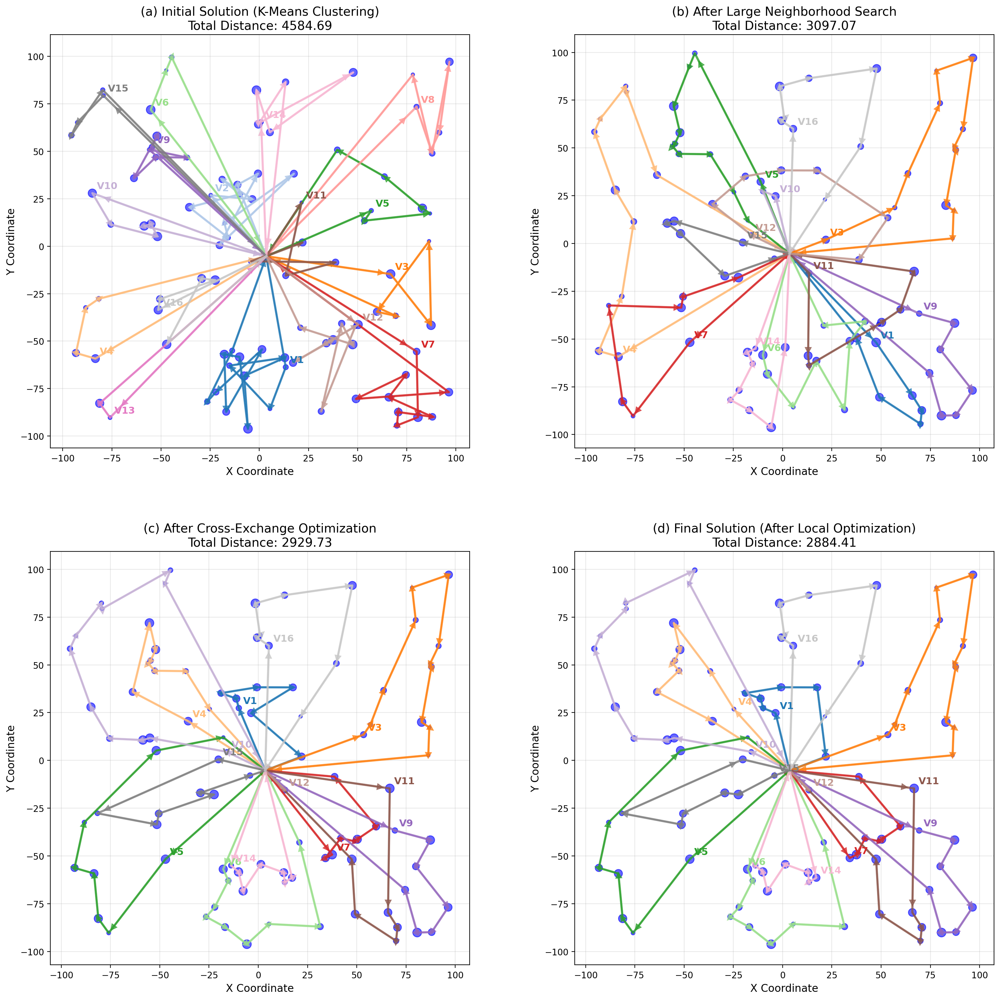

In [37]:
def create_optimization_stages_figure(depot, clients, solutions, titles, figsize=(16, 16), dpi=150):
    """
    Create a 2x2 grid showing the different optimization stages.
    
    Parameters:
    - depot: Depot information
    - clients: List of clients
    - solutions: List of 4 route dictionaries [initial, LNS, cross_exchange, final]
    - titles: List of 4 titles for each subplot
    - figsize: Figure size (width, height) in inches
    - dpi: Resolution (dots per inch)
    """
    # Create client map
    client_map = {client["ID"]: client for client in clients}
    client_map[0] = depot
    
    # Create figure with 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=figsize, dpi=dpi)
    axes = axes.flatten()
    
    # Create a consistent colormap
    colors = plt.cm.tab20.colors
    vehicle_color_map = {}
    
    # Define subplot labels
    subplot_labels = ['(a)', '(b)', '(c)', '(d)']
    
    # Plot each solution in one subplot
    for ax, solution, title, label in zip(axes, solutions, titles, subplot_labels):
        # Plot clients with size based on demand
        client_x = [client["X"] for client in clients]
        client_y = [client["Y"] for client in clients]
        demands = [client["Demand"] for client in clients]
        
        # Plot clients
        ax.scatter(client_x, client_y, c="blue", label="Clients", 
                s=[d * 5 for d in demands], alpha=0.6)
        
        # Plot depot
        ax.scatter(depot["X"], depot["Y"], c="red", label="Depot", 
                s=150, marker="X")
        
        # Calculate total distance for title
        total_distance = sum(calculate_route_distance(route, client_map) 
                           for route in solution.values() if len(route) > 1)
        
        # Update subplot title with subplot label
        ax.set_title(f"{label} {title}\nTotal Distance: {total_distance:.2f}", fontsize=14)
        
        # Plot each route with consistent coloring across subplots
        for vehicle_id, route in solution.items():
            if len(route) <= 2:  # Skip empty routes
                continue
                
            # Get consistent color for this vehicle
            if vehicle_id not in vehicle_color_map:
                vehicle_color_map[vehicle_id] = colors[len(vehicle_color_map) % len(colors)]
            color = vehicle_color_map[vehicle_id]
            
            # Plot route
            route_x = [client_map[client_id]["X"] for client_id in route]
            route_y = [client_map[client_id]["Y"] for client_id in route]
            ax.plot(route_x, route_y, c=color, linewidth=2.5, alpha=0.8)
            
            # Add arrows to show direction
            for j in range(len(route) - 1):
                dx = route_x[j+1] - route_x[j]
                dy = route_y[j+1] - route_y[j]
                ax.arrow(route_x[j], route_y[j], dx * 0.9, dy * 0.9, 
                      head_width=3, head_length=3, fc=color, ec=color, alpha=0.7)
            
            # Add vehicle ID label near first client
            if len(route) > 2:
                first_client_idx = 1  # First client after depot
                ax.annotate(f"V{vehicle_id}", 
                         (route_x[first_client_idx], route_y[first_client_idx]),
                         xytext=(5, 5), textcoords='offset points',
                         color=color, weight='bold', fontsize=11)
        
        # Add labels and grid
        ax.set_xlabel("X Coordinate", fontsize=12)
        ax.set_ylabel("Y Coordinate", fontsize=12)
        ax.grid(True, alpha=0.3)
        
        # No legend as requested
    
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.25, wspace=0.25)
    
    return fig

# Create the 2x2 visualization with all optimization stages
fig = create_optimization_stages_figure(
    depot=depot, 
    clients=clients,
    solutions=[
        initial_routes,
        lns_routes,
        cross_exchange_routes,
        optimized_routes
    ],
    titles=[
        "Initial Solution (K-Means Clustering)",
        "After Large Neighborhood Search",
        "After Cross-Exchange Optimization",
        "Final Solution (After Local Optimization)"
    ],
    figsize=(16, 16),
    dpi=200  # Higher resolution for document use
)

# Save the figure if needed
fig_path = os.path.join(os.getcwd(), f"vrp_optimization_stages_{vehicle_count}_vehicles.png")
fig.savefig(fig_path, bbox_inches='tight')
print(f"Figure saved to: {fig_path}")

plt.show()